# Game Genres Analysis and Prediction
## INFO 6105: Data Science Engineering Methods

Team 1: Ishan Subodh Joshi (NUID: 002836254)

Team 2: Kunal Singh Pundir (NUID: 002844188)

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

In [2]:
df = pd.read_csv("games.csv")

In [3]:
df.head(2)

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Average playtime two weeks,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83560 entries, 0 to 83559
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   AppID                       83560 non-null  int64  
 1   Name                        83554 non-null  object 
 2   Release date                83560 non-null  object 
 3   Estimated owners            83560 non-null  object 
 4   Peak CCU                    83560 non-null  int64  
 5   Required age                83560 non-null  int64  
 6   Price                       83560 non-null  float64
 7   DLC count                   83560 non-null  int64  
 8   About the game              80123 non-null  object 
 9   Supported languages         83560 non-null  object 
 10  Full audio languages        83560 non-null  object 
 11  Reviews                     9716 non-null   object 
 12  Header image                83560 non-null  object 
 13  Website                     390

## converting Release date to datetime dtype

In [5]:
df['Release date cleaned'] = pd.to_datetime(df['Release date'], errors='coerce')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83560 entries, 0 to 83559
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   AppID                       83560 non-null  int64         
 1   Name                        83554 non-null  object        
 2   Release date                83560 non-null  object        
 3   Estimated owners            83560 non-null  object        
 4   Peak CCU                    83560 non-null  int64         
 5   Required age                83560 non-null  int64         
 6   Price                       83560 non-null  float64       
 7   DLC count                   83560 non-null  int64         
 8   About the game              80123 non-null  object        
 9   Supported languages         83560 non-null  object        
 10  Full audio languages        83560 non-null  object        
 11  Reviews                     9716 non-null   object    

## dealing with null values in name column

In [7]:
df.loc[df['Name'].isna()].index

Index([25222, 72038, 77215, 77487, 77561, 77721], dtype='int64')

In [8]:
df = df.drop(df.loc[df['Name'].isna()].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83554 entries, 0 to 83559
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   AppID                       83554 non-null  int64         
 1   Name                        83554 non-null  object        
 2   Release date                83554 non-null  object        
 3   Estimated owners            83554 non-null  object        
 4   Peak CCU                    83554 non-null  int64         
 5   Required age                83554 non-null  int64         
 6   Price                       83554 non-null  float64       
 7   DLC count                   83554 non-null  int64         
 8   About the game              80122 non-null  object        
 9   Supported languages         83554 non-null  object        
 10  Full audio languages        83554 non-null  object        
 11  Reviews                     9716 non-null   object        


## Dealing with null values in About the game column

In [10]:
df.isna().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                 3432
Supported languages               0
Full audio languages              0
Reviews                       73838
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                       

In [11]:
df.loc[df['About the game'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
291,1613340,Pirates of the Asteroid Belt Playtest,"Apr 23, 2021",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.0,0,NaN,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [12]:
df.loc[df['About the game'].isna(),"Name"]

105                             溪风谷之战 Playtest
180                      Burial Stone Playtest
214                  Emperial Knights Playtest
220                     Slotracers VR Playtest
291      Pirates of the Asteroid Belt Playtest
                         ...                  
83502                      Until Then Playtest
83510        The World of Nifty Craft Playtest
83543                        Grønland Playtest
83547                      Tower Song Playtest
83550                    我在2083年的末世求生 Playtest
Name: Name, Length: 3432, dtype: object

In [13]:
# most of the games that dont have description are playtest
df.loc[df["Name"].str.contains('Playtest'),'About the game'] = "this is a playtest game is the process by which a game designer tests a new game for bugs and design flaws before releasing it to market."

In [14]:
df.isna().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                  186
Supported languages               0
Full audio languages              0
Reviews                       73838
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                       

In [15]:
df.loc[df['About the game'].isna(),"Name"]

956                           Project Scav
1118                               Abode 2
1377                    NARAKA: BLADEPOINT
3208                        Hello, Goodbye
3399                       Theatre of Doom
                       ...                
80710               Fablecraft Closed Beta
82698                Peanut's Journey Test
83061    Journey of Realm: Dawn Dew (Demo)
83155                        Fear The Void
83292                         Overwatch® 2
Name: Name, Length: 186, dtype: object

In [16]:
#there are only 148 games left I explored them i found certain words that are repeating, i dealt with them then there 
 #is only 93 games left without a description
# for any beta game the null value sups with 'this game is beta and still under testing'
# for any Alpha game the null value sups with 'this game is Alpha and still under testing'
# for any Test game the null value sups with 'this game is Test and still under testing'
# for any playtest game the null value sups with 'this game is playtest and still under testing'
# for any SDK game the null value sups with 'this game is SDK and still under testing'
# for any Demo game the null value sups with 'this game is Demo and still under testing'
# for any server game the null value sups with 'this game is server and still under testing'
# for any editor game the null value sups with 'this game is Editor and still under testing'

for index, row in df.iterrows():
    if(pd.isnull(row['About the game'])):
        if 'Beta' in row['Name']:
            df.at[index, 'About the game'] = 'this game is beta and still under testing'
        elif "Alpha" in row['Name']:
            df.at[index, 'About the game'] = 'this game is Alpha and still under testing'
        elif "beta" in row['Name']:
            df.at[index, 'About the game'] = 'this game is beta and still under testing'
        elif "BETA" in row['Name']:
            df.at[index, 'About the game'] = 'this game is beta and still under testing'
        elif "Test" in row['Name']:
            df.at[index, 'About the game'] = 'this game is and still under testing'
        elif "playtest" in row['Name']:
            df.at[index, 'About the game'] = 'this game is still under testing'
        elif "SDK" in row['Name']:
            df.at[index, 'About the game'] = 'Software Development Kit of the game'
        elif "Demo" in row['Name']:
            df.at[index, 'About the game'] = 'this game is Demo and still under testing'
        elif "Server" in row['Name']:
            df.at[index, 'About the game'] = 'this is a Server for the game'
        elif "Editor" in row['Name']:
            df.at[index, 'About the game'] = 'this is an Editor for the game'
        else:
            df.at[index, 'About the game'] = 'this game does not have a description'
            
        
        

In [17]:
df.isna().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Reviews                       73838
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                       

## dealing with reviews column

In [18]:
df["Reviews"].unique()

array([nan,
       "“New WW2 Strategy Game Offers A Harrowing Look At Poland's Ill-Fated 1944 Uprising” GameSpot “(…) in execution Warsaw manages to deliver its own experience entirely.” Dualshockers “(…) Beautiful hand-painted artwork and turn-based combat (…)” Gameinformer",
       '“The art in Cthulhu Realms is hilarious and beautifully done, somehow complimenting the horror theme perfectly. The production value is top-notch.” Gameosity “It’s a surprisingly effective package that delivers a great little deck builder with a low price tag. If you can embrace the playful theme, you’ll find a pleasant gem in Cthulhu Realms.” Geek Ken “It certainly is not just another deck-building game, but has original and fresh mechanics that will challenge your brain.” Board Game Maniac',
       ...,
       '“My wife likes it very much.” GoodMan “Very easy.Unbelievable ease.” AltMan “Suitable for giving to friends, especially Christmas.” Friend',
       '“Elevating the Metroidvania Genre” 9.5/10 – No

In [19]:
df = df.drop('Reviews', axis=1)

In [20]:
df.isna().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [21]:
df.head()

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2008-10-21
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2017-10-12
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2021-11-17
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2020-07-23
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2020-02-03


In [22]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [23]:
df["Metacritic score"].unique()

array([ 0, 62, 64, 53, 84, 89, 70, 86, 40, 87, 92, 76, 51, 49, 81, 69, 72,
       68, 52, 82, 59, 77, 79, 71, 74, 73, 88, 47, 75, 66, 50, 63, 67, 80,
       58, 90, 39, 78, 55, 85, 65, 91, 83, 57, 56, 44, 60, 61, 48, 46, 23,
       45, 94, 27, 38, 30, 35, 54, 41, 43, 32, 34, 93, 37, 36, 95, 42, 29,
       24, 96, 20, 33, 97], dtype=int64)

In [24]:
df_score = df.groupby("Metacritic score").agg({
    "Name":"count"
})
df_score

,Name
Metacritic score,
0,79644
20,1
23,1
24,1
27,2
...,...
93,14
94,12
95,2


In [25]:
df["Metacritic url"].unique()

array([nan,
       'https://www.metacritic.com/game/pc/warsaw?ftag=MCD-06-10aaa1f',
       'https://www.metacritic.com/game/pc/alien-breed-3-descent?ftag=MCD-06-10aaa1f',
       ...,
       'https://www.metacritic.com/game/pc/the-making-of-karateka?ftag=MCD-06-10aaa1f',
       'https://www.metacritic.com/game/pc/torn-away?ftag=MCD-06-10aaa1f',
       'https://www.metacritic.com/game/pc/stronghold-definitive-edition?ftag=MCD-06-10aaa1f'],
      dtype=object)

In [26]:
df["User score"].unique()

array([  0,  63,  59,  77,  68, 100,  57,  80,  51,  69,  97,  53,  46,
        65,  55,  84,  71,  60,  61,  78,  87,  92,  73,  83,  82,  98,
        76,  66,  95,  94,  96,  88,  70], dtype=int64)

In [27]:
df_score = df.groupby("User score").agg({
    "Name":"count"
})
df_score

,Name
User score,
0,83510
46,2
51,2
53,1
55,1
57,1
59,1
60,1
61,1


In [28]:
df_score = df.groupby(["Name","Positive","Negative"]).agg({
    "Name":"count"
})
df_score

,,,Name
Name,Positive,Negative,
! Shakabula *,1,1,1
! That Bastard Is Trying To Steal Our Gold !,26,62,1
! Wild Russia !,41,22,1
!AnyWay!,246,113,1
!LABrpgUP!,21,27,1
...,...,...,...
👾 Foreign Frugglers,19,0,1
🔴 Circles,83,8,1
🚀 Human Rocket Person,54,7,1


In [29]:
df["Positive"].unique()

array([   6,   53,    0, ..., 1236, 2039, 4842], dtype=int64)

In [30]:
df["Negative"].unique()

array([   11,     5,     0, ...,  1036, 15425, 26511], dtype=int64)

In [31]:
#number of in game Achievements
df["Achievements"].unique()

array([  30,   12,    0,   17,   62,   25,   32,   34,   19,   13,   48,
          4,   43,   60,   10,   73,   22,   11,   29,   50,  211,   18,
         20,  178,   14,   35,   24,    7,  159,   46,    3,   45,    9,
          8,  199,    2,   80,   42,    5,   44,   40,   61,   27,   74,
         21,   16,    6,   28,   38,   56,  111,   51,   26,   64,   37,
         47,  294,   83,   15,   31,    1,  100,   39,   53,   52,   33,
         36,   23,  148,   41,  124,  102,   90,   72,   76,  104,   54,
         71,   57,   92,  400,   77,   86,  109,   59,   70,   58,  650,
       5000,   75,   68, 1224,  555,   84,   67,  106,  131,   55,   95,
         66,   49,  398,  506,   78,   88,   85,  463,   98,   63, 3340,
        130,  565,   65,  144,  191,  225,   82,  103,   69,  272,  150,
        123,  658,   99, 4956,  112,  147,  113,  300,  674,   87,  351,
         89, 1000,   91,  151,  154,   94,   79,   96,  142, 1011,  110,
        120,  543,  121, 1354,  101,  583,  265,  1

In [32]:
df_ach = df.groupby("Achievements").agg({
    "Name":"count"
})
df_ach

,Name
Achievements,
0,42346
1,885
2,459
3,633
4,830
...,...
4997,1
4999,1
5000,59


In [33]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [34]:
df["Recommendations"].unique()

array([   0,  427,  285, ..., 3218, 4964, 6040], dtype=int64)

In [35]:
df_avg = df.groupby("Average playtime forever").agg({
    "Name":"count"
})
df_avg

,Name
Average playtime forever,
0,68650
1,342
2,133
3,105
4,106
...,...
68357,1
76068,1
90351,1


In [36]:
df_avg = df.groupby("Average playtime two weeks").agg({
    "Name":"count"
})
df_avg

,Name
Average playtime two weeks,
0,81506
1,74
2,24
3,24
4,20
...,...
10993,1
10994,1
10995,1


## Developers and puplishers columns cleaning together

In [37]:
df["Developers"].unique()

array(['Perpetual FX Creative', 'Rusty Moyher', 'Campião Games', ...,
       'Daniel Melo Machado', 'aquma', 'CasuRae'], dtype=object)

In [38]:
df.loc[df['Developers'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
291,1613340,Pirates of the Asteroid Belt Playtest,"Apr 23, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [39]:
df.isnull().sum()


AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [40]:
df.loc[df['Developers'].isna(),"Name"].unique()

array(['溪风谷之战 Playtest', 'Burial Stone Playtest',
       'Emperial Knights Playtest', ..., 'Grønland Playtest',
       'Tower Song Playtest', '我在2083年的末世求生 Playtest'], dtype=object)

In [41]:
df.loc[df['Developers'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
291,1613340,Pirates of the Asteroid Belt Playtest,"Apr 23, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [42]:
df.loc[df['Publishers'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
23,810740,Turtle Lu,"Mar 22, 2018",20000 - 50000,0,0,2.99,0,Turtle Lu Turtle Lu is an old-school Action-Ad...,['English'],...,0,0,Falco Software,NaN,Single-player,"Action,Adventure,Casual,Indie","Action,Adventure,Indie,Casual,Platformer,Arcad...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2018-03-22
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.00,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [43]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Publishers'])):
        if(pd.isnull(row['Developers'])):
            continue
        else:
            print(row['Developers'])
            count += 1
print(count)

Falco Software
AndrewMD5,Codeusa
Tindalos Interactive
Team Meat
G.Reed
Eagle Dynamics SA
TallTech studio
Falco Software
Demon Sword Games
Naturally Intelligent
Mostly Tigerproof
Quaint Emerald
Fon Danyrotsky
Camagames
Eric Steinberg
none
Dialogue Design
Dylan Fitterer
Moka
RLR Training Inc
17th Dimension
Matt Edzenga
Invincibles Studio Ltd
ReaverGames
Niken Hertanto,Inkan Hertanto,Juan Rosales,Runze (Eric) Guo,Patrick Kagel
TerkStudios
Zoltok's
Matt Sowards
Caipirinha Games GmbH
Unwonted Studios
Ragiva Games
NineOhGames
Bacq Stellan
Underflow Studios
Pixelcat Productions
Peak Angle Team
Matthew Vimislik
Queasy Games
Hitbox Team
Nina Freeman,Laura Knetzger,Stephen Lawrence Clark
DKC Game Studio
Chernov Vyacheslav
Elephant Games
Iridium Studios
Tavrox,Visumeca
XiNFiNiTY Games,Nova Studios
Claudio Norori,Antonio Vargas
Kodo Linija
battleMETALDevs
XiNFiNiTY Games
HYDEZEKE
Sharpened Edge Studios
Stefan Bauwens,Cindy Ho
Bacq Stellan
Caipirinha Games GmbH
Cold Tea Studio
MIGI STUDIO
Kalopsia 

Elephant Games
Anyland + Manyland
Isojumper
LIONHEART GAMING
Elephant Games
Puny Human
Zachary Berenger,Eli Aldinger
Shawn Colbert
Outbreak Games,Momoiro Soft.
Signal Studios
Oleg Skutte
LIONHEART GAMING
Falco Software
Think Arcade
XiNFiNiTY Games
Lord Sharpe
Creat Studios Inc
XiNFiNiTY Games
Obscura Team
Yintento
Bundle Of Sticks Studios
Ilias Giouroukis
RainDance LX
XiNFiNiTY Games
Iocaine Studios
Starodymov
Chocolate Homunculus,Tilt Studios
Anyland + Manyland
Paul Eckhardt
XiNFiNiTY Games
Mythical City Games,LNG Studios
Darmaal
W@ Games
Freegamer
Worthless Bums
Falco Software
Bacq Stellan
Geojitsu
TecEh! Studios
Cat5Games
Daydream Software
Team Eyepatch
tfk1 games studios
Denis Galanin (mif2000)
Sylvestre Studio
Greg Lobanov
XiNFiNiTY Games
Valve
Big Red Eight
Mahelyk
Zero Sum Games
Vitali Kirpu
Mikeypoo's Games,David Szymanski
HUMAN LIVE,萌豆游戏
Hashbang Games
Round8 Studio
DrainLive
Falco Software
Petar Markovich,James Arkwright
DangerousBob Studio LLC
The Commander
Michael J. Moffit

In [44]:
df.isnull().sum()


AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [45]:
# I found that there are 289 games that the developer is mentioned but the publisher is not mentioned
# so I assigned the publisher to be the same as the developer
for index, row in df.iterrows():
    if(pd.isnull(row['Publishers'])):
        if(pd.isnull(row['Developers'])):
            continue
        else:
            df.at[index, 'Publishers'] = df.at[index, 'Developers']

In [46]:
df.isnull().sum()


AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [47]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Developers'])):
        if(pd.isnull(row['Publishers'])):
            continue
        else:
            print(row['Publishers'])
            count += 1
print(count)

SEGA
SEGA
Forever Entertainment S. A.
Type B Negative
Meridian4
Ubisoft
Activision
Kalypso Media Digital
Retroism
Mediamas Europa
SEGA
Topware Interactive
familyplay
SEGA
familyplay
Displacement Studios
familyplay
No Gravity Games
bilibili
SEGA
Displacement Studios
SEGA
familyplay
SEGA
SEGA
Asmodee Digital
nightowls
Square Enix
Topware Interactive
Electronic Arts
Ubisoft
SEGA
Meridian4
Displacement Studios
SEGA
Strategy First
Topware Interactive ACE
familyplay
Games-Up
dualgm
Forever Entertainment S. A.
Type B Negative
PsychoFlux Entertainment
familyplay,Markt+Technik
familyplay
Cosmi Valusoft
Displacement Studios
Origo Games
Nekki GmbH
Displacement Studios
Senpai Studios
Square Enix
Square Enix
Square Enix
Rebellion
Sixense
Wadjet Eye Games
United Independent Entertainment
58


In [48]:
# I found that there are 58 games that the Publishers is mentioned but the Developers is not mentioned
# so I assigned the publisher to be the same as the developer
for index, row in df.iterrows():
    if(pd.isnull(row['Developers'])):
        if(pd.isnull(row['Publishers'])):
            continue
        else:
            df.at[index, 'Developers'] = df.at[index, 'Publishers']

In [49]:
df.isnull().sum()


AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [50]:
df.loc[df['Developers'].isna(),"Name"].unique()

array(['溪风谷之战 Playtest', 'Burial Stone Playtest',
       'Emperial Knights Playtest', ..., 'Grønland Playtest',
       'Tower Song Playtest', '我在2083年的末世求生 Playtest'], dtype=object)

In [51]:
df.loc[df['Publishers'].isna(),"Name"].unique()

array(['溪风谷之战 Playtest', 'Burial Stone Playtest',
       'Emperial Knights Playtest', ..., 'Grønland Playtest',
       'Tower Song Playtest', '我在2083年的末世求生 Playtest'], dtype=object)

In [52]:
df.loc[df['Developers'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
291,1613340,Pirates of the Asteroid Belt Playtest,"Apr 23, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [53]:
df.loc[df['Publishers'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
105,1943590,溪风谷之战 Playtest,"Mar 24, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-24
180,1966960,Burial Stone Playtest,"Apr 13, 2022",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2022-04-13
214,1688630,Emperial Knights Playtest,"Nov 14, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2021-11-14
220,1478660,Slotracers VR Playtest,"Dec 17, 2020",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-12-17
291,1613340,Pirates of the Asteroid Belt Playtest,"Apr 23, 2021",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83502,2557030,Until Then Playtest,"Aug 19, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-19
83510,2545190,The World of Nifty Craft Playtest,"Aug 10, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-10
83543,2704600,Grønland Playtest,"Nov 24, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,NaN,2023-11-24
83547,2607070,Tower Song Playtest,"Sep 21, 2023",0 - 0,0,0,0.0,0,this is a playtest game is the process by whic...,[],...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-21


In [54]:
#after exploring the Developers column i noticed some key words that are repeating i delt with every case then i left up with
# 120 game that the developer is not mentioned

# for any beta game the null value sups with 'this game is Playtest and still under development'
# for any Alpha game the null value sups with 'this game is Alpha and still under testing the developer is not mentioned'
# for any Test game the null value sups with 'this game is test and still under testing the developer is not mentioned'
# for any playtest game the null value sups with 'this game is playtest still under testing the developer is not mentioned'
# for any SDK game the null value sups with 'this game is SDK still under testing the developer is not mentioned'
# for any Demo game the null value sups with 'this game is Demo still under testing the developer is not mentioned'
# for any server game the null value sups with 'this game is server still under testing the developer is not mentioned'
# for any editor game the null value sups with 'this game is Editor still under testing the developer is not mentioned'

for index, row in df.iterrows():
    if(pd.isnull(row['Developers'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Developers'] = 'this game is Playtest and still under development'
        elif "Alpha" in row['Name']:
            df.at[index, 'Developers'] = 'this game is Alpha and still under testing the developer is not mentioned'
        elif "beta" in row['Name']:
            df.at[index, 'Developers'] = 'this game is beta and still under testing the developer is not mentioned'
        elif "BETA" in row['Name']:
            df.at[index, 'Developers'] = 'this game is beta and still under testing the developer is not mentioned'
        elif "Test" in row['Name']:
            df.at[index, 'Developers'] = 'this game is and still under testing the developer is not mentioned'
        elif "playtest" in row['Name']:
            df.at[index, 'Developers'] = 'this game is still under testing the developer is not mentioned'
        elif "SDK" in row['Name']:
            df.at[index, 'Developers'] = 'Software Development Kit of the game the developer is not mentioned'
        elif "Demo" in row['Name']:
            df.at[index, 'Developers'] = 'this game is Demo and still under testing the developer is not mentioned'
        elif "Server" in row['Name']:
            df.at[index, 'Developers'] = 'this is a Server for the game the developer is not mentioned'
        elif "Editor" in row['Name']:
            df.at[index, 'Developers'] = 'this is an Editor for the game the developer is not mentioned'
        elif "Beta" in row['Name']:
            df.at[index, 'Developers'] = 'this game is beta and still under testing the developer is not mentioned'
        else:
            df.at[index, 'Developers'] = 'No developer mentioned for this game'
  

In [55]:
#after exploring the Publishers column i noticed some key words that are repeating i delt with every case then i left up with
# 120 game that the Publisher is not mentioned

# for any beta game the null value sups with 'this game is Playtest and still under development'
# for any Alpha game the null value sups with 'this game is Alpha and still under testing the publisher is not mentioned'
# for any Test game the null value sups with 'this game is test and still under testing the publisher is not mentioned'
# for any playtest game the null value sups with 'this game is playtest still under testing the publisher is not mentioned'
# for any SDK game the null value sups with 'this game is SDK still under testing the publisher is not mentioned'
# for any Demo game the null value sups with 'this game is Demo still under testing the publisher is not mentioned'
# for any server game the null value sups with 'this game is server still under testing the publisher is not mentioned'
# for any editor game the null value sups with 'this game is Editor still under testing the publisher is not mentioned'

for index, row in df.iterrows():
    if(pd.isnull(row['Publishers'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Publishers'] = 'this game is Playtest and still under development'
        elif "Alpha" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is Alpha and still under testing the publisher is not mentioned'
        elif "beta" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is beta and still under testing the publisher is not mentioned'
        elif "BETA" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is beta and still under testing the publisher is not mentioned'
        elif "Test" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is and still under testing the publisher is not mentioned'
        elif "playtest" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is still under testing the publisher is not mentioned'
        elif "SDK" in row['Name']:
            df.at[index, 'Publishers'] = 'Software Development Kit of the game the publisher is not mentioned'
        elif "Demo" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is Demo and still under testing the publisher is not mentioned'
        elif "Server" in row['Name']:
            df.at[index, 'Publishers'] = 'this is a Server for the game the publisher is not mentioned'
        elif "Editor" in row['Name']:
            df.at[index, 'Publishers'] = 'this is an Editor for the game the publisher is not mentioned'
        elif "Beta" in row['Name']:
            df.at[index, 'Publishers'] = 'this game is beta and still under testing the publisher is not mentioned'
        else:
            df.at[index, 'Publishers'] = 'No publisher mentioned for this game'
  

In [56]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## Categories column cleaning

In [57]:
df["Categories"].unique()

array(['Single-player,Multi-player,Steam Achievements,Partial Controller Support',
       'Single-player,Steam Achievements,Full controller support,Steam Leaderboards,Remote Play on Phone,Remote Play on Tablet,Remote Play on TV',
       'Single-player', ...,
       'Single-player,Multi-player,Co-op,Online Co-op,Cross-Platform Multiplayer,Steam Achievements,In-App Purchases,Partial Controller Support',
       'Single-player,Multi-player,PvP,LAN PvP,Shared/Split Screen PvP,Shared/Split Screen,Steam Cloud,Remote Play Together',
       'Single-player,VR Supported,In-App Purchases'], dtype=object)

In [58]:
df["Genres"].unique()

array(['Casual,Indie,Sports', 'Action,Indie',
       'Action,Adventure,Indie,Strategy', ...,
       'Action,Simulation,Strategy,Free to Play',
       'Adventure,Casual,Massively Multiplayer,RPG',
       'Action,Casual,RPG,Simulation,Strategy'], dtype=object)

In [59]:
df["Tags"].unique()

array(['Indie,Casual,Sports,Bowling',
       'Indie,Action,Pixel Graphics,2D,Retro,Arcade,Score Attack,Minimalist,Comedy,Singleplayer,Fast-Paced,Casual,Funny,Parody,Difficult,Gore,Violent,Western,Controller,Blood',
       nan, ...,
       "VR,Arcade,Puzzle-Platformer,Action,Destruction,3D,Casual,Physics,Relaxing,Platformer,3D Platformer,Score Attack,Third Person,Stylized,Logic,Colorful,Funny,Comedy,Bullet Time,Shoot 'Em Up",
       'Adventure,Cats,Cute,First-Person,Exploration,Atmospheric,Walking Simulator,Action-Adventure,3D Platformer,Hidden Object,3D,Relaxing,Multiple Endings,Conversation,Indie,Story Rich,Singleplayer,Casual',
       'Casual,Puzzle,Hidden Object,Creature Collector,2D,Cute,Minimalist,Hand-drawn,Futuristic,Family Friendly,Aliens,Space,Logic,Relaxing,Time Manipulation,Score Attack,Singleplayer,Indie'],
      dtype=object)

In [60]:
df.loc[df['Categories'].isna(),"Name"].unique()

array(['Home Office Tasker', '溪风谷之战 Playtest',
       'Kooring VR Coding Adventure', ..., 'Grønland Playtest',
       'Tower Song Playtest', '我在2083年的末世求生 Playtest'], dtype=object)

In [61]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Categories'])):
        if 'Playtest' in row['Name']:
            count += 1
        else:
            continue
    else:
        continue
print(count)

3208


In [62]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Categories'])):
        if 'Playtest' in row['Name']:
            count += 1
        elif "Alpha" in row['Name']:
            count += 1
        elif "beta" in row['Name']:
            count += 1
        elif "BETA" in row['Name']:
            count += 1
        elif "Test" in row['Name']:
            count += 1
        elif "playtest" in row['Name']:
            count += 1
        elif "SDK" in row['Name']:
            count += 1
        elif "Demo" in row['Name']:
            count += 1
        elif "Server" in row['Name']:
            count += 1
        elif "Editor" in row['Name']:
            count += 1
        elif "Beta" in row['Name']:
            count += 1
        else:
            continue
print(count)

3304


In [63]:
#after exploring the Categories column i noticed some key words that are repeating i delt with every case then i left up with
# 1009 game that the Publisher is not mentioned

# for any beta game the null value sups with 'Beta game not playable'
# for any Alpha game the null value sups with 'Alpha  game not playable'
# for any Test game the null value sups with 'this game game not playable'
# for any playtest game the null value sups with 'Playtest game not playable'
# for any SDK game the null value sups with 'Software Development Kit of the game not playable'
# for any Demo game the null value sups with 'Demo game not playable'
# for any server game the null value sups with 'Server of a game not playable'
# for any editor game the null value sups with 'Beta game not playable'
for index, row in df.iterrows():
    if(pd.isnull(row['Categories'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Categories'] = 'Playtest game not playable'
        elif "Alpha" in row['Name']:
            df.at[index, 'Categories'] = 'Alpha game not playable'
        elif "beta" in row['Name']:
            df.at[index, 'Categories'] = 'Beta game not playable'
        elif "BETA" in row['Name']:
            df.at[index, 'Categories'] = 'Beta game not playable'
        elif "Test" in row['Name']:
            df.at[index, 'Categories'] = 'test game not playable'
        elif "playtest" in row['Name']:
            df.at[index, 'Categories'] = 'Playtest game not playable'
        elif "SDK" in row['Name']:
            df.at[index, 'Categories'] = 'Software Development Kit of the game not playable'
        elif "Demo" in row['Name']:
            df.at[index, 'Categories'] = 'Demo game not playable'
        elif "Server" in row['Name']:
            df.at[index, 'Categories'] = 'Server of a game not playable'
        elif "Editor" in row['Name']:
            df.at[index, 'Categories'] = 'Editor of a game not playable'
        elif "Beta" in row['Name']:
            df.at[index, 'Categories'] = 'Beta game not playable'
        else:
            continue

In [64]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [65]:
df.loc[df['Categories'].isna(),"Name"].unique()

array(['Home Office Tasker', 'Kooring VR Coding Adventure',
       'Maria Blanchard Virtual Gallery', ..., 'Infinite Pattern',
       'Gundam Girl Studio for VRChat and Vroid', 'iTop Easy Desktop'],
      dtype=object)

In [66]:
df.loc[df['Categories'].isna(),"Name"]

31                            Home Office Tasker
145                  Kooring VR Coding Adventure
216              Maria Blanchard Virtual Gallery
359                      Gamefuel Driver Control
450                                      Start10
                          ...                   
83323                           Ultraleap Gemini
83327                              Crosshair Pro
83456                           Infinite Pattern
83527    Gundam Girl Studio for VRChat and Vroid
83534                          iTop Easy Desktop
Name: Name, Length: 1149, dtype: object

In [67]:
# dealing with 1009 games left
for index, row in df.iterrows():
    if(pd.isnull(row['Categories'])):
        df.at[index, 'Categories'] = 'no Category added'


In [68]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## Genres column cleaning

In [69]:
df["Genres"].unique()

array(['Casual,Indie,Sports', 'Action,Indie',
       'Action,Adventure,Indie,Strategy', ...,
       'Action,Simulation,Strategy,Free to Play',
       'Adventure,Casual,Massively Multiplayer,RPG',
       'Action,Casual,RPG,Simulation,Strategy'], dtype=object)

In [70]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Genres'])):
        if 'Playtest' in row['Name']:
            count += 1
        elif "Alpha" in row['Name']:
            count += 1
        elif "beta" in row['Name']:
            count += 1
        elif "BETA" in row['Name']:
            count += 1
        elif "Test" in row['Name']:
            count += 1
        elif "playtest" in row['Name']:
            count += 1
        elif "SDK" in row['Name']:
            count += 1
        elif "Demo" in row['Name']:
            count += 1
        elif "Server" in row['Name']:
            count += 1
        elif "Editor" in row['Name']:
            count += 1
        elif "Beta" in row['Name']:
            count += 1
        else:
            continue
print(count)

3308


In [71]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

In [72]:
df.loc[df["Genres"].isnull(),"Name"]

105                             溪风谷之战 Playtest
180                      Burial Stone Playtest
214                  Emperial Knights Playtest
220                     Slotracers VR Playtest
291      Pirates of the Asteroid Belt Playtest
                         ...                  
83502                      Until Then Playtest
83510        The World of Nifty Craft Playtest
83543                        Grønland Playtest
83547                      Tower Song Playtest
83550                    我在2083年的末世求生 Playtest
Name: Name, Length: 3423, dtype: object

In [73]:
# dealing with 100 games left
for index, row in df.iterrows():
    if(pd.isnull(row['Genres'])):
        df.at[index, 'Genres'] = 'no Genres added'

In [74]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## cleaning Tags column

In [75]:
df["Tags"].unique()

array(['Indie,Casual,Sports,Bowling',
       'Indie,Action,Pixel Graphics,2D,Retro,Arcade,Score Attack,Minimalist,Comedy,Singleplayer,Fast-Paced,Casual,Funny,Parody,Difficult,Gore,Violent,Western,Controller,Blood',
       nan, ...,
       "VR,Arcade,Puzzle-Platformer,Action,Destruction,3D,Casual,Physics,Relaxing,Platformer,3D Platformer,Score Attack,Third Person,Stylized,Logic,Colorful,Funny,Comedy,Bullet Time,Shoot 'Em Up",
       'Adventure,Cats,Cute,First-Person,Exploration,Atmospheric,Walking Simulator,Action-Adventure,3D Platformer,Hidden Object,3D,Relaxing,Multiple Endings,Conversation,Indie,Story Rich,Singleplayer,Casual',
       'Casual,Puzzle,Hidden Object,Creature Collector,2D,Cute,Minimalist,Hand-drawn,Futuristic,Family Friendly,Aliens,Space,Logic,Relaxing,Time Manipulation,Score Attack,Singleplayer,Indie'],
      dtype=object)

In [76]:
df["Genres"].unique()

array(['Casual,Indie,Sports', 'Action,Indie',
       'Action,Adventure,Indie,Strategy', ...,
       'Action,Simulation,Strategy,Free to Play',
       'Adventure,Casual,Massively Multiplayer,RPG',
       'Action,Casual,RPG,Simulation,Strategy'], dtype=object)

In [77]:
df.loc[df['Tags'].isna()]

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2021-11-17
7,1968760,Legend of Rome - The Wrath of Mars,"May 5, 2022",0 - 20000,2,0,9.99,0,When the Roman people honored a simple warrior...,"['English', 'German']",...,0,0,magnussoft,magnussoft,"Single-player,Steam Cloud",Casual,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2022-05-05
18,1097880,Super Naughty Maid 2,"Jun 20, 2019",0 - 20000,4,0,9.59,2,"Story Leona, your cute and lewd maid is back f...","['English', 'Traditional Chinese']",...,30,0,KENZsoft,Denpasoft,"Single-player,Steam Trading Cards","Casual,Indie",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2019-06-20
29,1177420,邻居大叔/UncleNeighbor:uncle Dating Simulator,"Jun 19, 2020",0 - 20000,19,0,13.99,1,Neighbor Uncle/UncleNeighbor: This is a love s...,"['Simplified Chinese', 'English', 'Portuguese ...",...,0,0,GameUncle,GameUncle,"Single-player,Steam Achievements","Adventure,Casual,Indie,RPG,Simulation",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2020-06-19
43,1056520,Who We Are Now,"May 7, 2019",0 - 20000,0,0,14.99,2,"Who We Are Now is a queer, post-apocalyptic vi...",['English'],...,0,0,Chroma Field Games,Chroma Field Games,Single-player,Indie,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2019-05-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83553,2640580,Pew Pew Squad,"Dec 1, 2023",0 - 0,0,0,2.69,0,"🧟 In Pew Pew Squad, you're a lone survivor in ...","['English', 'Portuguese - Brazil', 'French', '...",...,0,0,Daniel Melo Machado,Daniel Melo Machado,Single-player,"Action,Indie,Early Access",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2023-12-01
83555,2591500,Sex Simulator - Office Promotion,"Sep 16, 2023",0 - 20000,0,0,3.99,0,ABOUT THE GAME A sex simulation game with visu...,['English'],...,0,0,EroticGamesClub,EroticGamesClub,"Single-player,Steam Achievements,Steam Leaderb...","Adventure,Casual,Indie",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2023-09-16
83557,2308790,UNDRESS!,"Oct 23, 2023",0 - 20000,0,0,1.99,0,UNDRESS! - is an exciting game in which the pl...,"['English', 'Simplified Chinese', 'Korean', 'R...",...,0,0,aquma,aquma,"Single-player,Steam Achievements",Casual,NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2023-10-23
83558,2669970,Oculant,"Nov 22, 2023",0 - 20000,0,0,4.99,0,Story: The world is shrouded with the eclipse ...,['English'],...,0,0,CasuRae,CasuRae,Single-player,"Action,Adventure,Casual",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2023-11-22


In [78]:
# i noticed the tags of every game are so smmiler to the Genres of the game so for every game that has no tags the geners will replace it 
for index, row in df.iterrows():
    if(pd.isnull(row['Tags'])):
        df.at[index, 'Tags'] = df.at[index, 'Genres']
    

In [79]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## cleaning screenshots column

In [80]:
df["Screenshots"].unique()

array(['https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005994.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005993.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005992.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000006011.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005685.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005686.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005995.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005688.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005689.1920x1080.jpg?t=1640121033,https://cdn.akamai.steamstatic.com/steam/apps/20200/0000005690.1920x1080.jpg?t=1640121033',
       'https://cdn.akamai.steamstatic.com/steam/apps/655370/ss_16785eac54b29db688870e832f

In [81]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Screenshots'])):
        if 'Playtest' in row['Name']:
            count += 1
        else:
            continue
    else:
        continue
print(count)

1818


In [82]:
# for any playtest game null sups with 'Playtest game no screenshot available'
# anything else 'no screenshot available'
for index, row in df.iterrows():
    if(pd.isnull(row['Screenshots'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Screenshots'] = 'Playtest game no screenshot available'
        else:
            df.at[index, 'Screenshots'] = 'no screenshot available'

In [83]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## cleaning Movies column

In [84]:
df["Movies"].unique()

array(['http://cdn.akamai.steamstatic.com/steam/apps/256863704/movie_max.mp4?t=1638854607',
       'http://cdn.akamai.steamstatic.com/steam/apps/256691108/movie_max.mp4?t=1506089586',
       'http://cdn.akamai.steamstatic.com/steam/apps/256847488/movie_max.mp4?t=1635980739,http://cdn.akamai.steamstatic.com/steam/apps/256847487/movie_max.mp4?t=1635980747',
       ...,
       'http://cdn.akamai.steamstatic.com/steam/apps/256950107/movie_max.mp4?t=1685548154',
       'http://cdn.akamai.steamstatic.com/steam/apps/256978325/movie_max.mp4?t=1699479286',
       'http://cdn.akamai.steamstatic.com/steam/apps/256959811/movie_max.mp4?t=1690491958'],
      dtype=object)

In [85]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Movies'])):
        if 'Playtest' in row['Name']:
            count += 1
        elif "Alpha" in row['Name']:
            count += 1
        elif "beta" in row['Name']:
            count += 1
        elif "BETA" in row['Name']:
            count += 1
        elif "Test" in row['Name']:
            count += 1
        elif "playtest" in row['Name']:
            count += 1
        elif "SDK" in row['Name']:
            count += 1
        elif "Demo" in row['Name']:
            count += 1
        elif "Server" in row['Name']:
            count += 1
        elif "Editor" in row['Name']:
            count += 1
        elif "Beta" in row['Name']:
            count += 1
        else:
            continue
print(count)

3354


In [86]:
# for any beta game the null value sups with 'Beta Playtest game no trailer available'
# for any Alpha game the null value sups with 'Alpha  Playtest game no trailer available'
# for any Test game the null value sups with 'this game game no trailer available'
# for any playtest game the null value sups with 'Playtest game no trailer available'
# for any SDK game the null value sups with 'Software Development Kit of the game  game no trailer available'
# for any Demo game the null value sups with 'Demo  game no trailer available'
# for any server game the null value sups with 'Server of a game no trailer available'
# for any editor game the null value sups with 'Beta game no trailer available'
# any thing else "no trailer available"

for index, row in df.iterrows():
    if(pd.isnull(row['Movies'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Movies'] = 'Playtest game no trailer available'
        elif "Alpha" in row['Name']:
            df.at[index, 'Movies'] = 'Alpha game no trailer available'
        elif "beta" in row['Name']:
            df.at[index, 'Movies'] = 'Beta game no trailer available'
        elif "BETA" in row['Name']:
            df.at[index, 'Movies'] = 'Beta game no trailer available'
        elif "Test" in row['Name']:
            df.at[index, 'Movies'] = 'test game no trailer available'
        elif "playtest" in row['Name']:
            df.at[index, 'Movies'] = 'Playtest game no trailer available'
        elif "SDK" in row['Name']:
            df.at[index, 'Movies'] = 'Software Development Kit of the game no trailer available'
        elif "Demo" in row['Name']:
            df.at[index, 'Movies'] = 'Demo game no trailer available'
        elif "Server" in row['Name']:
            df.at[index, 'Movies'] = 'Server of a game no trailer available'
        elif "Editor" in row['Name']:
            df.at[index, 'Movies'] = 'Editor of a game no trailer available'
        elif "Beta" in row['Name']:
            df.at[index, 'Movies'] = 'Beta game no trailer available'
        else:
            df.at[index, 'Movies'] = 'no trailer available'

In [87]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Website                       44500
Support url                   42543
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
Metacritic url                79644
User score                        0
Positive                          0
Negative                          0
Score rank                    83510
Achievements                      0
Recommendations                   0
Notes                         70842
Average playtime forever    

## deleting notes, score rank, Metacritic url, website, Support url columns because they have alot of null values more than 50%

In [88]:
df = df.drop('Notes', axis=1)
df = df.drop('Score rank', axis=1)
df = df.drop('Metacritic url', axis=1)
df = df.drop('Support url', axis=1)
df = df.drop('Website', axis=1)

In [89]:
df.isnull().sum()

AppID                             0
Name                              0
Release date                      0
Estimated owners                  0
Peak CCU                          0
Required age                      0
Price                             0
DLC count                         0
About the game                    0
Supported languages               0
Full audio languages              0
Header image                      0
Support email                 13315
Windows                           0
Mac                               0
Linux                             0
Metacritic score                  0
User score                        0
Positive                          0
Negative                          0
Achievements                      0
Recommendations                   0
Average playtime forever          0
Average playtime two weeks        0
Median playtime forever           0
Median playtime two weeks         0
Developers                        0
Publishers                  

## cleaning support email column

In [90]:
df["Support email"].unique()

array([nan, 'support@rustymoyher.com', 'ramoncampiaof31@gmail.com', ...,
       'contato@daniciti.com', 'aqumawtf@gmail.com',
       'casualrae@gmail.com'], dtype=object)

In [91]:
count = 0
for index, row in df.iterrows():
    if(pd.isnull(row['Support email'])):
        if 'Playtest' in row['Name']:
            count += 1
        elif "Alpha" in row['Name']:
            count += 1
        elif "beta" in row['Name']:
            count += 1
        elif "BETA" in row['Name']:
            count += 1
        elif "Test" in row['Name']:
            count += 1
        elif "playtest" in row['Name']:
            count += 1
        elif "SDK" in row['Name']:
            count += 1
        elif "Demo" in row['Name']:
            count += 1
        elif "Server" in row['Name']:
            count += 1
        elif "Editor" in row['Name']:
            count += 1
        elif "Beta" in row['Name']:
            count += 1
        else:
            continue
print(count)

3380


In [92]:
# for any beta game the null value sups with 'Beta Pno Support email available'
# for any Alpha game the null value sups with 'Alpha  no Support email available'
# for any Test game the null value sups with 'this test game no Support email available'
# for any playtest game the null value sups with 'Playtest gameno Support email available'
# for any SDK game the null value sups with 'Software Development Kit of the game no Support email available'
# for any Demo game the null value sups with 'Demo  game no trailer available'
# for any server game the null value sups with 'Server of a game no Support email available'
# for any editor game the null value sups with 'Beta game no Support email available'
# any thing else "no Support email available"

for index, row in df.iterrows():
    if(pd.isnull(row['Support email'])):
        if 'Playtest' in row['Name']:
            df.at[index, 'Support email'] = 'Playtest game no Support email available'
        elif "Alpha" in row['Name']:
            df.at[index, 'Support email'] = 'Alpha game no Support email available'
        elif "beta" in row['Name']:
            df.at[index, 'Support email'] = 'Beta game no Support email available'
        elif "BETA" in row['Name']:
            df.at[index, 'Support email'] = 'Beta game no Support email available'
        elif "Test" in row['Name']:
            df.at[index, 'Support email'] = 'test game no Support email available'
        elif "playtest" in row['Name']:
            df.at[index, 'Support email'] = 'Playtest game no Support email available'
        elif "SDK" in row['Name']:
            df.at[index, 'Support email'] = 'Software Development Kit of the game no Support email available'
        elif "Demo" in row['Name']:
            df.at[index, 'Support email'] = 'Demo game no Support email available'
        elif "Server" in row['Name']:
            df.at[index, 'Support email'] = 'Server of a game no Support email available'
        elif "Editor" in row['Name']:
            df.at[index, 'Support email'] = 'Editor of a game no Support email available'
        elif "Beta" in row['Name']:
            df.at[index, 'Support email'] = 'Beta game no Support email available'
        else:
            df.at[index, 'Support email'] = 'no Support email available'

In [93]:
df.isnull().sum()

AppID                           0
Name                            0
Release date                    0
Estimated owners                0
Peak CCU                        0
Required age                    0
Price                           0
DLC count                       0
About the game                  0
Supported languages             0
Full audio languages            0
Header image                    0
Support email                   0
Windows                         0
Mac                             0
Linux                           0
Metacritic score                0
User score                      0
Positive                        0
Negative                        0
Achievements                    0
Recommendations                 0
Average playtime forever        0
Average playtime two weeks      0
Median playtime forever         0
Median playtime two weeks       0
Developers                      0
Publishers                      0
Categories                      0
Genres        

In [94]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned'],
      dtype='object')

In [95]:
# i added 6 columns to the data frame 'Release date cleaned', 'OS', 'owners clean', 'Free or paid', 'Game have support', 'year'

## Data visulization 

In [96]:
from plotly import express as px

## most downloaded Game

In [97]:
df["Estimated owners"]

0        0 - 20000
1        0 - 20000
2        0 - 20000
3        0 - 20000
4        0 - 20000
           ...    
83555    0 - 20000
83556    0 - 20000
83557    0 - 20000
83558    0 - 20000
83559    0 - 20000
Name: Estimated owners, Length: 83554, dtype: object

In [98]:
# the owners are estimated in range so i got the median of the range to compare with it
def owners_clean(x):
    x = x.strip()
    x= x.split("-")
    x = [num.strip(' ') for num in x]
    num1 = int(x[0])
    num2 = int(x[1])
    med = (num2 - num1)/2
    return med


In [99]:
owners_clean("0 - 20000")

10000.0

In [100]:
for index, row in df.iterrows(): 
     df.at[index, 'owners clean'] = owners_clean(df.at[index, 'Estimated owners'])

In [101]:
df["owners clean"]

0        10000.0
1        10000.0
2        10000.0
3        10000.0
4        10000.0
          ...   
83555    10000.0
83556    10000.0
83557    10000.0
83558    10000.0
83559    10000.0
Name: owners clean, Length: 83554, dtype: float64

In [102]:
most_downloaded_games = df.groupby("Name").agg({
    "owners clean":"sum"
}).reset_index().sort_values("owners clean",ascending=False).head(10)

In [103]:
most_downloaded_games

,Name,owners clean
19113,Dota 2,50000000.0
14054,Counter-Strike: Global Offensive,25000000.0
66371,Team Fortress 2,25000000.0
48611,PUBG: BATTLEGROUNDS,25000000.0
45751,New World,25000000.0
71589,Tom Clancy's Rainbow Six® Siege,15040000.0
74052,Unturned,15000000.0
76129,War Thunder,15000000.0
66675,Terraria,15000000.0
74750,Valheim,15000000.0


In [104]:
most_downloaded_games_graph = px.bar(most_downloaded_games, y='owners clean', x='Name', title='most downloaded games')
most_downloaded_games_graph.show()

## most expensive games

In [105]:
df["Price"]

0        19.99
1         0.99
2         4.99
3         5.99
4         0.00
         ...  
83555     3.99
83556     0.49
83557     1.99
83558     4.99
83559     0.99
Name: Price, Length: 83554, dtype: float64

In [106]:
most_expensive_games = df.groupby("Name").agg({
    "Price":"sum"
}).reset_index().sort_values("Price",ascending=False).head(10)

In [107]:
most_expensive_games

,Name,Price
68857,The Leverage Game Business Edition,999.98
68856,The Leverage Game,999.98
4741,Ascent Free-Roaming VR Experience,999.00
1759,Aartform Curvy 3D 3.0,299.90
20509,EA SPORTS FC™ 24,279.96
32326,Houdini Indie,269.99
74240,VEGAS 19 Edit - Steam Edition,249.00
53454,RagingFist,199.99
65648,TNMverse VIP,199.99
52485,Puzzle toys,199.99


In [108]:
most_expensive_games_graph = px.bar(most_expensive_games, y='Price', x='Name', title='most expensive games')
most_expensive_games_graph.show()

## most downloaded games and thier price

In [109]:
most_downloaded_games_price = df.groupby(["Name","Price"]).agg({
    "owners clean":"sum"
}).reset_index().sort_values("owners clean",ascending=False).head(10)

In [110]:
most_downloaded_games_price

,Name,Price,owners clean
19246,Dota 2,0.00,50000000.0
14156,Counter-Strike: Global Offensive,0.00,25000000.0
66786,Team Fortress 2,0.00,25000000.0
48913,PUBG: BATTLEGROUNDS,0.00,25000000.0
46035,New World,39.99,25000000.0
72055,Tom Clancy's Rainbow Six® Siege,19.99,15040000.0
29861,Half-Life 2: Lost Coast,0.00,15000000.0
48673,PAYDAY 2,9.99,15000000.0
67091,Terraria,9.99,15000000.0
39361,Lost Ark,0.00,15000000.0


In [111]:
# df_sorted_downloads is below in the code
price_downloads_relation_graph = px.line(most_downloaded_games_price, x="owners clean", y="Price", title='Relation between downloads and price')
price_downloads_relation_graph.show()

## Prices distribution

In [112]:
Prices_distribution_graph = px.box(df, y="Price")

In [113]:
Prices_distribution_graph

In [114]:
# adding free or paid column to estimate how many free and paid games in the store
def free_or_paid(x):
    if x == 0:
        return "Free"
    else:
        return "paid"

In [115]:
for index, row in df.iterrows(): 
     df.at[index, 'Free or paid'] = free_or_paid(df.at[index, 'Price'])

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\1146719418.py:2: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'paid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [116]:
df.head(2)

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies,Release date cleaned,owners clean,Free or paid
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2008-10-21,10000.0,paid
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...,2017-10-12,10000.0,paid


In [117]:
paid_and_free_count = df.groupby("Free or paid").agg({
    "Name":"count"
}).reset_index()
paid_and_free_count

,Free or paid,Name
0,Free,16103
1,paid,67451


In [118]:
paid_and_free_count_graph = px.pie(paid_and_free_count, values='Name', names='Free or paid', title='How many free and paid game in the store')
paid_and_free_count_graph.show()

## Average downloads for free and paid games

In [119]:
paid_and_free_downloads = df.groupby("Free or paid").agg({
    "owners clean":"mean"
}).reset_index()
paid_and_free_downloads

,Free or paid,owners clean
0,Free,53348.444389
1,paid,32793.731746


In [120]:
paid_and_free_downloads_graph = px.bar(paid_and_free_downloads, y='owners clean', x='Free or paid', title='Average downloads for free and paid games')
paid_and_free_downloads_graph.show()

In [121]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned', 'owners clean', 'Free or paid'],
      dtype='object')

## Most Supported languages 

In [122]:
df["Supported languages"]

0                                              ['English']
1        ['English', 'French', 'Italian', 'German', 'Sp...
2                       ['English', 'Portuguese - Brazil']
3        ['English', 'French', 'Italian', 'German', 'Sp...
4                           ['English', 'Spanish - Spain']
                               ...                        
83555                                          ['English']
83556    ['English', 'French', 'Italian', 'German', 'Sp...
83557    ['English', 'Simplified Chinese', 'Korean', 'R...
83558                                          ['English']
83559    ['English', 'French', 'Italian', 'German', 'Sp...
Name: Supported languages, Length: 83554, dtype: object

In [123]:
language_count = {}
for language in df['Supported languages'].to_list():
    language = language.strip()
    language_sub = language.split(',')
    for key in language_sub:
        key = key.strip()
        key = key.replace("'", "")
        key = key.replace("[", "")
        key = key.replace("]", "")
        key = key.replace("&amp;lt;strong&amp;gt;&amp;lt;/strong&amp;gt;", "")
        key = key.replace("b/b", "")
        key = key.replace("/b", "")
        key = key.replace(" \\r\\n\\r\\nb/b ", "")
        key = key.replace("/b", "")
        key = key.replace("\\r\\nb/b", "")
        key = key.replace("\\r\\n", "")
        key = key.replace("#", "")
        key = key.replace("\r\\n\\r\\n", "")
        key = key.replace("Russian\\r\\nEnglish\\r\\nSpanish - Spain\\r\\nFrench\\r\\nJapanese\\r\\nCzech", "")
        key = key.replace("\r\\n", "")
        key = key.replace(" &amp;lt;br /&amp;gt;&amp;lt;br /&amp;gt; ", "")
        key = key.replace("RussianEnglishSpanish - SpainFrenchJapaneseCzech", "")
        language_count[key] = language_count.get(key, 0) + 1

In [124]:
language_count

{'English': 76743,
 'French': 17783,
 'Italian': 12389,
 'German': 18368,
 'Spanish - Spain': 16428,
 'Japanese': 15071,
 'Portuguese - Brazil': 9340,
 'Russian': 17110,
 'Simplified Chinese': 18920,
 'Traditional Chinese': 9376,
 'Korean': 9680,
 'Portuguese': 4186,
 'Danish': 2678,
 'Polish': 7402,
 'Turkish': 5237,
 'Czech': 3377,
 'Hungarian': 2835,
 'Dutch': 4401,
 'Ukrainian': 3055,
 'Spanish - Latin America': 4388,
 'Arabic': 2803,
 'Norwegian': 2585,
 'Romanian': 2329,
 'Swedish': 3122,
 'Thai': 2804,
 'Vietnamese': 2139,
 '': 3359,
 'Finnish': 2577,
 'Bulgarian': 2116,
 'Greek': 2321,
 'German;': 2,
 'lang_français': 1,
 'Traditional Chinese (text only)': 1,
 'Japanese  ': 1,
 'Italian  ': 1,
 'English (full audio)': 3,
 ' Korean': 1,
 'Slovakian': 2,
 'EnglishRussianSpanish - SpainJapaneseCzech': 1,
 'Japanese (all with full audio support)': 1,
 'English Dutch  English': 1,
 'Portuguese - Portugal': 1677,
 'Afrikaans': 333,
 'Amharic': 321,
 'Albanian': 335,
 'Assamese': 322,

In [125]:
language_count = pd.DataFrame.from_dict(language_count, orient='index').reset_index()

In [126]:
language_count.columns = ['language', 'Frequency']
language_count = language_count.sort_values('Frequency', ascending = False).head(10)

In [127]:
language_count

,language,Frequency
0,English,76743
8,Simplified Chinese,18920
3,German,18368
1,French,17783
7,Russian,17110
4,Spanish - Spain,16428
5,Japanese,15071
2,Italian,12389
10,Korean,9680
9,Traditional Chinese,9376


In [128]:
language_count_graph = px.bar(language_count, y='Frequency', x='language', title='Top games languages')
language_count_graph.show()

## Average downloads for games that has support and games that not

In [129]:
df["Support email"].unique()

array(['no Support email available', 'support@rustymoyher.com',
       'ramoncampiaof31@gmail.com', ..., 'contato@daniciti.com',
       'aqumawtf@gmail.com', 'casualrae@gmail.com'], dtype=object)

In [130]:
for index, row in df.iterrows():
    if  df.at[index, 'Support email'] == "no Support email available":
        df.at[index, 'Game have support'] = False
    else:
        df.at[index, 'Game have support'] = True

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\3422274662.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [131]:
downloads_for_supported_games = df.groupby("Game have support").agg({
    "owners clean":"mean"
}).reset_index()
downloads_for_supported_games

,Game have support,owners clean
0,False,128828.384499
1,True,24329.724663


In [132]:
downloads_for_supported_games_graph = px.bar(downloads_for_supported_games, y='owners clean', x='Game have support', title='Average downloads for games that have support and games that not')
downloads_for_supported_games_graph.show()

In [133]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned', 'owners clean', 'Free or paid',
       'Game have support'],
      dtype='object')

## most used operation system for games

In [134]:
# creating new column OS
for index, row in df.iterrows():
    if row["Windows"] == True:
        df.at[index, 'OS'] = "Windows"
        if row["Mac"] == True:
            df.at[index, 'OS'] = "Windows, Mac"
            if row["Linux"] == True:
                df.at[index, 'OS'] = "Windows, Mac, Linux"
        elif row["Linux"] == True:
            df.at[index, 'OS'] = "Windows, Linux"
    elif row["Windows"] == False and row["Mac"] == True:
        df.at[index, 'OS'] = "Mac"
        if row["Linux"] == True:
            df.at[index, 'OS'] = "Windows, Linux"
    elif row["Windows"] == False and row["Mac"] == False and row["Linux"] == True:
        df.at[index, 'OS'] = "Linux"

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\3020003888.py:4: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Windows' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [135]:
df["Windows"].sum()

83524

In [136]:
df["Mac"].sum()

16216

In [137]:
df["Linux"].sum()

11065

In [138]:
# games that work on more than one operation system 
average_downloads_for_deferent_os = df.groupby("OS").agg({
    "owners clean":"mean"
}).reset_index()
average_downloads_for_deferent_os

,OS,owners clean
0,Linux,9000.000000
1,Mac,11041.666667
2,Windows,28961.952665
3,"Windows, Linux",38069.444444
4,"Windows, Mac",43877.924454
5,"Windows, Mac, Linux",89220.725995


In [139]:
average_downloads_for_deferent_os_graph = px.bar(average_downloads_for_deferent_os, y='owners clean', x='OS', title='Average downloads for games that work on deferent operation system')
average_downloads_for_deferent_os_graph.show()

## Top games that have positive ratings and negative ratings 

In [140]:
df["Positive"].max()

5764420

In [141]:
top_positive_ratings_games = df.groupby("Name").agg({
    "Positive":"sum"
}).reset_index().sort_values("Positive",ascending = False).head(10)
top_positive_ratings_games


,Name,Positive
14054,Counter-Strike: Global Offensive,5764420
71589,Tom Clancy's Rainbow Six® Siege,2179536
19113,Dota 2,1477153
28464,Grand Theft Auto V,1171197
48611,PUBG: BATTLEGROUNDS,1154655
66675,Terraria,964983
66371,Team Fortress 2,823693
27079,Garry's Mod,822326
56436,Rust,703687
37796,Left 4 Dead 2,619457


In [142]:
top_positive_ratings_games_graph = px.bar(top_positive_ratings_games, y='Positive', x='Name', title='Top positive rating games')
top_positive_ratings_games_graph.show()

In [143]:
top_negative_ratings_games = df.groupby("Name").agg({
    "Negative":"sum"
}).reset_index().sort_values("Negative",ascending = False).head(10)
top_negative_ratings_games


,Name,Negative
48611,PUBG: BATTLEGROUNDS,895978
14054,Counter-Strike: Global Offensive,766677
71589,Tom Clancy's Rainbow Six® Siege,395207
19113,Dota 2,300437
28464,Grand Theft Auto V,210154
15413,Cyberpunk 2077,129925
16806,Dead by Daylight,112924
56436,Rust,108223
6808,Battlefield™ 2042,106038
82705,鬼谷八荒 Tale of Immortal,103661


In [144]:
top_negative_ratings_games_graph = px.bar(top_negative_ratings_games, y='Negative', x='Name', title='Top negative rating games')
top_negative_ratings_games_graph.show()

## Most downloaded games with there positive and nigative ratings

In [145]:
top_downloaded_games_with_rating = df.groupby("Name").agg({
    "owners clean":"sum",
    "Negative":"sum",
    "Positive":"sum"
    
}).reset_index().sort_values("owners clean",ascending = False).head(10)
top_downloaded_games_with_rating


,Name,owners clean,Negative,Positive
19113,Dota 2,50000000.0,300437,1477153
14054,Counter-Strike: Global Offensive,25000000.0,766677,5764420
66371,Team Fortress 2,25000000.0,56683,823693
48611,PUBG: BATTLEGROUNDS,25000000.0,895978,1154655
45751,New World,25000000.0,73900,154914
71589,Tom Clancy's Rainbow Six® Siege,15040000.0,395207,2179536
74052,Unturned,15000000.0,41385,443320
76129,War Thunder,15000000.0,67506,246926
66675,Terraria,15000000.0,21044,964983
74750,Valheim,15000000.0,16241,337177


In [146]:
top_downloaded_games_with_rating_graph = go.Figure(data=[
    go.Bar(name='Negative', x=top_downloaded_games_with_rating["Name"], y=top_downloaded_games_with_rating["Negative"]),
    go.Bar(name='Positive', x=top_downloaded_games_with_rating["Name"], y=top_downloaded_games_with_rating["Positive"])
])
# Change the bar mode
top_downloaded_games_with_rating_graph.update_layout(barmode='group',title_text='Top downloaded games with number of positive ratings and nigative ratings')
top_downloaded_games_with_rating_graph.show()

## Relation between downloads and ratings

In [147]:
df_sorted_downloads = df.sort_values("owners clean",ascending=False)

In [148]:
downloads_positive_rating_relation_graph = px.line(df_sorted_downloads, x="owners clean", y="Positive", title='Relation between downloads and positive ratings')
downloads_positive_rating_relation_graph.show()

In [149]:
downloads_negative_rating_relation_graph = px.line(df_sorted_downloads, x="owners clean", y="Negative", title='Relation between downloads and negative ratings')
downloads_negative_rating_relation_graph.show()

## Relation between price and ratings

In [150]:
df_sorted_price = df.sort_values("Price",ascending=False)

In [151]:
price_positive_rating_relation_graph = px.line(df_sorted_price, x="Price", y="Positive", title='Relation between price and positive ratings')
price_positive_rating_relation_graph.show()

In [152]:
price_negative_rating_relation_graph = px.line(df_sorted_price, x="Price", y="Negative", title='Relation between price and negative ratings')
price_negative_rating_relation_graph.show()

In [153]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned', 'owners clean', 'Free or paid',
       'Game have support', 'OS'],
      dtype='object')

## Top Developers 

In [154]:
# top developers
top_developers_total_downloads = df.groupby("Developers").agg({
    "owners clean":"sum"
}).reset_index().sort_values("owners clean",ascending = False).head(10)
top_developers_total_downloads

,Developers,owners clean
42112,Valve,174370000.0
13188,Facepunch Studios,30050000.0
20856,"KRAFTON, Inc.",25275000.0
42114,"Valve,Hidden Path Entertainment",25000000.0
2175,Amazon Games,25000000.0
41467,Ubisoft Montreal,22395000.0
6339,"CAPCOM Co., Ltd.",18670000.0
4654,Bethesda Game Studios,17250000.0
32992,Respawn Entertainment,17075000.0
33495,Rockstar North,15650000.0


In [155]:
top_developers_total_downloads_graph = px.bar(top_developers_total_downloads, y='owners clean', x='Developers', title='Developers that have Top downloads',
  labels={ "owners clean": "Total downloads",})
top_developers_total_downloads_graph.show()

In [156]:
# developers that have top downloads with there positive and negative ratings
top_developers_downloads_with_positive_and_negative= df.groupby("Developers").agg({
    "owners clean":"sum",
    "Positive":"sum",
    "Negative":"sum"
}).reset_index().sort_values("owners clean",ascending = False).head(10)
top_developers_downloads_with_positive_and_negative

,Developers,owners clean,Positive,Negative
42112,Valve,174370000.0,4485026,450698
13188,Facepunch Studios,30050000.0,1527225,137407
20856,"KRAFTON, Inc.",25275000.0,1157817,897352
42114,"Valve,Hidden Path Entertainment",25000000.0,5764420,766677
2175,Amazon Games,25000000.0,154914,73900
41467,Ubisoft Montreal,22395000.0,2386620,432780
6339,"CAPCOM Co., Ltd.",18670000.0,836139,101817
4654,Bethesda Game Studios,17250000.0,1011497,174578
32992,Respawn Entertainment,17075000.0,620908,84736
33495,Rockstar North,15650000.0,1173846,211162


In [157]:
top_downloaded_games_with_rating_graph = go.Figure(data=[
    go.Bar(name='Negative', x=top_developers_downloads_with_positive_and_negative["Developers"], y=top_developers_downloads_with_positive_and_negative["Negative"]),
    go.Bar(name='Positive', x=top_developers_downloads_with_positive_and_negative["Developers"], y=top_developers_downloads_with_positive_and_negative["Positive"])
])
# Change the bar mode
top_downloaded_games_with_rating_graph.update_layout(barmode='group',
    title_text='Developers that have top downloads with there positive and negative ratings',
    xaxis_title="Top developers",
    yaxis_title="Ratings")
top_downloaded_games_with_rating_graph.show()

In [158]:
# top developers with positive ratings
top_developers_total_positive_ratings = df.groupby("Developers").agg({
    "Positive":"sum"
}).reset_index().sort_values("Positive",ascending = False).head(10)
top_developers_total_positive_ratings

,Developers,Positive
42114,"Valve,Hidden Path Entertainment",5764420
42112,Valve,4485026
41467,Ubisoft Montreal,2386620
13188,Facepunch Studios,1527225
33495,Rockstar North,1173846
6379,CD PROJEKT RED,1169827
20856,"KRAFTON, Inc.",1157817
4654,Bethesda Game Studios,1011497
32442,Re-Logic,964983
6339,"CAPCOM Co., Ltd.",836139


In [159]:
top_developers_total_positive_ratings_graph = px.bar(top_developers_total_positive_ratings, y='Positive', x='Developers', title='Developers that have Top positive ratings',
  labels={ "Positive": "Total positive ratings",})
top_developers_total_positive_ratings_graph.show()

In [160]:
# most negative rated developers
top_developers_total_negative_ratings = df.groupby("Developers").agg({
    "Negative":"sum"
}).reset_index().sort_values("Negative",ascending = False).head(10)
top_developers_total_negative_ratings

,Developers,Negative
20856,"KRAFTON, Inc.",897352
42114,"Valve,Hidden Path Entertainment",766677
42112,Valve,450698
41467,Ubisoft Montreal,432780
33495,Rockstar North,211162
6379,CD PROJEKT RED,177171
9184,DICE,176590
4654,Bethesda Game Studios,174578
13188,Facepunch Studios,137407
5522,Bohemia Interactive,127793


In [161]:

top_developers_total_negative_ratings_graph = px.bar(top_developers_total_negative_ratings, y='Negative', x='Developers', title='Developers that have Top Negative ratings',
  labels={ "Negative": "Total Negative ratings",})
top_developers_total_negative_ratings_graph.show()

## Top Publishers

In [162]:
top_publishers_total_downloads = df.groupby("Publishers").agg({
    "owners clean":"sum"
}).reset_index().sort_values("owners clean",ascending = False).head(10)
top_publishers_total_downloads

,Publishers,owners clean
36678,Valve,222020000.0
36086,Ubisoft,68150000.0
10378,Electronic Arts,57595000.0
4045,Bethesda Softworks,42720000.0
38417,Xbox Game Studios,41095000.0
1905,Amazon Games,40000000.0
227,2K,32795000.0
29694,SEGA,32005000.0
29225,Rockstar Games,30365000.0
32286,Square Enix,27950000.0


In [163]:
top_publishers_total_downloads_graph = px.bar(top_publishers_total_downloads, y='owners clean', x='Publishers', title='Puplishers that have Top downloads',
  labels={ "owners clean": "Total downloads",})
top_publishers_total_downloads_graph.show()

In [164]:
# Publishers that have top downloads with there positive and negative ratings
top_Publishers_downloads_with_positive_and_negative= df.groupby("Publishers").agg({
    "owners clean":"sum",
    "Positive":"sum",
    "Negative":"sum"
}).reset_index().sort_values("owners clean",ascending = False).head(10)
top_Publishers_downloads_with_positive_and_negative

,Publishers,owners clean,Positive,Negative
36678,Valve,222020000.0,11097327,1248173
36086,Ubisoft,68150000.0,3669254,735954
10378,Electronic Arts,57595000.0,1861001,443862
4045,Bethesda Softworks,42720000.0,2057709,315276
38417,Xbox Game Studios,41095000.0,1443435,189288
1905,Amazon Games,40000000.0,279222,117966
227,2K,32795000.0,627658,195174
29694,SEGA,32005000.0,797227,115538
29225,Rockstar Games,30365000.0,1764218,304783
32286,Square Enix,27950000.0,774338,161496


In [165]:
top_downloaded_games_with_rating_graph = go.Figure(data=[
    go.Bar(name='Negative', x=top_Publishers_downloads_with_positive_and_negative["Publishers"], y=top_Publishers_downloads_with_positive_and_negative["Negative"]),
    go.Bar(name='Positive', x=top_Publishers_downloads_with_positive_and_negative["Publishers"], y=top_Publishers_downloads_with_positive_and_negative["Positive"])
])
# Change the bar mode
top_downloaded_games_with_rating_graph.update_layout(barmode='group',
    title_text='Publishers that have top downloads with there positive and negative ratings',
    xaxis_title="Top Publishers",
    yaxis_title="Ratings")
top_downloaded_games_with_rating_graph.show()

## Games Categories

In [166]:
df["Categories"].unique()

array(['Single-player,Multi-player,Steam Achievements,Partial Controller Support',
       'Single-player,Steam Achievements,Full controller support,Steam Leaderboards,Remote Play on Phone,Remote Play on Tablet,Remote Play on TV',
       'Single-player', ...,
       'Single-player,Multi-player,Co-op,Online Co-op,Cross-Platform Multiplayer,Steam Achievements,In-App Purchases,Partial Controller Support',
       'Single-player,Multi-player,PvP,LAN PvP,Shared/Split Screen PvP,Shared/Split Screen,Steam Cloud,Remote Play Together',
       'Single-player,VR Supported,In-App Purchases'], dtype=object)

In [167]:
df["Categories"][0]

'Single-player,Multi-player,Steam Achievements,Partial Controller Support'

In [168]:
def categories_clean(x):
    x = x.split(",")
    return x

In [169]:
categories_clean('Single-player,Multi-player,Steam Achievements,Partial Controller Support')

['Single-player',
 'Multi-player',
 'Steam Achievements',
 'Partial Controller Support']

In [170]:
categories_count = {}
for categories in df['Categories']:
    words = categories_clean(categories)
    for word in words:
        categories_count[word] = categories_count.get(word, 0) + 1

In [171]:
categories_count

{'Single-player': 75091,
 'Multi-player': 15382,
 'Steam Achievements': 36358,
 'Partial Controller Support': 10473,
 'Full controller support': 15804,
 'Steam Leaderboards': 6742,
 'Remote Play on Phone': 820,
 'Remote Play on Tablet': 981,
 'Remote Play on TV': 2161,
 'MMO': 1270,
 'PvP': 9709,
 'Online PvP': 6935,
 'Co-op': 7689,
 'Online Co-op': 4376,
 'In-App Purchases': 2257,
 'Steam Cloud': 18591,
 'Steam Trading Cards': 9885,
 'Shared/Split Screen': 5617,
 'Cross-Platform Multiplayer': 2310,
 'Remote Play Together': 6104,
 'Stats': 3552,
 'Shared/Split Screen PvP': 4036,
 'no Category added': 1149,
 'Captions available': 1185,
 'Steam Workshop': 1852,
 'Includes level editor': 1952,
 'LAN PvP': 688,
 'LAN Co-op': 593,
 'Shared/Split Screen Co-op': 3149,
 'Playtest game not playable': 3212,
 'Steam Turn Notifications': 91,
 'VR Support': 250,
 'SteamVR Collectibles': 41,
 'Valve Anti-Cheat enabled': 124,
 'Includes Source SDK': 51,
 'Commentary available': 238,
 'Editor of a gam

In [172]:
categories_count = pd.DataFrame.from_dict(categories_count, orient='index').reset_index()

In [173]:
categories_count.columns = ['category', 'Frequency']
categories_count = categories_count.sort_values('Frequency', ascending = False)
categories_count

,category,Frequency
0,Single-player,75091
2,Steam Achievements,36358
15,Steam Cloud,18591
4,Full controller support,15804
1,Multi-player,15382
3,Partial Controller Support,10473
16,Steam Trading Cards,9885
10,PvP,9709
12,Co-op,7689
11,Online PvP,6935


In [174]:
# most games categories on the store
categories_count.head(10)

,category,Frequency
0,Single-player,75091
2,Steam Achievements,36358
15,Steam Cloud,18591
4,Full controller support,15804
1,Multi-player,15382
3,Partial Controller Support,10473
16,Steam Trading Cards,9885
10,PvP,9709
12,Co-op,7689
11,Online PvP,6935


In [175]:
for index, row in categories_count.iterrows():
    if categories_count.at[index , "Frequency"] < 5943 :
        categories_count.at[index , "category"] = "others"

In [176]:
categories_count

,category,Frequency
0,Single-player,75091
2,Steam Achievements,36358
15,Steam Cloud,18591
4,Full controller support,15804
1,Multi-player,15382
3,Partial Controller Support,10473
16,Steam Trading Cards,9885
10,PvP,9709
12,Co-op,7689
11,Online PvP,6935


In [177]:
# 
pie_chart_categories_count = categories_count.groupby("category").agg({
    "Frequency":"sum"
}).reset_index()
pie_chart_categories_count

,category,Frequency
0,Co-op,7689
1,Full controller support,15804
2,Multi-player,15382
3,Online PvP,6935
4,Partial Controller Support,10473
5,PvP,9709
6,Remote Play Together,6104
7,Single-player,75091
8,Steam Achievements,36358
9,Steam Cloud,18591


In [178]:
top_cattegories_graph = px.pie(pie_chart_categories_count, values='Frequency', names='category', title='Games Catogeries')
top_cattegories_graph.show()

## top 3 Categories, Average downloads 

In [179]:
df_categories = df[["Name","owners clean","Price","Categories"]].copy()

In [180]:
df_categories

,Name,owners clean,Price,Categories
0,Galactic Bowling,10000.0,19.99,"Single-player,Multi-player,Steam Achievements,..."
1,Train Bandit,10000.0,0.99,"Single-player,Steam Achievements,Full controll..."
2,Jolt Project,10000.0,4.99,Single-player
3,Henosis™,10000.0,5.99,"Single-player,Full controller support"
4,Two Weeks in Painland,10000.0,0.00,"Single-player,Steam Achievements"
...,...,...,...,...
83555,Sex Simulator - Office Promotion,10000.0,3.99,"Single-player,Steam Achievements,Steam Leaderb..."
83556,UFindO,10000.0,0.49,"Single-player,Steam Achievements"
83557,UNDRESS!,10000.0,1.99,"Single-player,Steam Achievements"
83558,Oculant,10000.0,4.99,Single-player


In [181]:
#creating 3 columns for top 3 Categories
for index, row in df_categories.iterrows():
    if "Single-player" in row["Categories"]:
        df_categories.at[index , "Single-player"] = True
for index, row in df_categories.iterrows():
    if "Steam Achievements" in row["Categories"]:
        df_categories.at[index ,"Steam Achievements"] = True
for index, row in df_categories.iterrows():
    if "Steam Cloud" in row["Categories"]:
        df_categories.at[index ,"Steam Cloud"] = True
        

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\2883176788.py:4: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\2883176788.py:7: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\2883176788.py:10: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [182]:
df_categories

,Name,owners clean,Price,Categories,Single-player,Steam Achievements,Steam Cloud
0,Galactic Bowling,10000.0,19.99,"Single-player,Multi-player,Steam Achievements,...",True,True,NaN
1,Train Bandit,10000.0,0.99,"Single-player,Steam Achievements,Full controll...",True,True,NaN
2,Jolt Project,10000.0,4.99,Single-player,True,NaN,NaN
3,Henosis™,10000.0,5.99,"Single-player,Full controller support",True,NaN,NaN
4,Two Weeks in Painland,10000.0,0.00,"Single-player,Steam Achievements",True,True,NaN
...,...,...,...,...,...,...,...
83555,Sex Simulator - Office Promotion,10000.0,3.99,"Single-player,Steam Achievements,Steam Leaderb...",True,True,NaN
83556,UFindO,10000.0,0.49,"Single-player,Steam Achievements",True,True,NaN
83557,UNDRESS!,10000.0,1.99,"Single-player,Steam Achievements",True,True,NaN
83558,Oculant,10000.0,4.99,Single-player,True,NaN,NaN


In [183]:
# Average downloads for Single-player category 
df_categories.groupby("Single-player").agg({
    "owners clean":"mean"
})

,owners clean
Single-player,
True,33059.820751


In [184]:
# Average downloads for Steam Achievements category 

df_categories.groupby("Steam Achievements").agg({
    "owners clean":"mean"
})

,owners clean
Steam Achievements,
True,52834.176797


In [185]:
# Average downloads for Steam Cloud category 

df_categories.groupby("Steam Cloud").agg({
    "owners clean":"mean"
})

,owners clean
Steam Cloud,
True,63895.164327


In [186]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned', 'owners clean', 'Free or paid',
       'Game have support', 'OS'],
      dtype='object')

## Top Genres

In [187]:
df["Genres"].unique()

array(['Casual,Indie,Sports', 'Action,Indie',
       'Action,Adventure,Indie,Strategy', ...,
       'Action,Simulation,Strategy,Free to Play',
       'Adventure,Casual,Massively Multiplayer,RPG',
       'Action,Casual,RPG,Simulation,Strategy'], dtype=object)

In [188]:
df["Genres"]

0                    Casual,Indie,Sports
1                           Action,Indie
2        Action,Adventure,Indie,Strategy
3                 Adventure,Casual,Indie
4                        Adventure,Indie
                      ...               
83555             Adventure,Casual,Indie
83556                       Casual,Indie
83557                             Casual
83558            Action,Adventure,Casual
83559                       Casual,Indie
Name: Genres, Length: 83554, dtype: object

In [189]:
def genres_clean(x):
    x = x.split(",")
    return x

In [190]:
genres_clean('Casual,Indie,Sports')

['Casual', 'Indie', 'Sports']

In [191]:
genres_count = {}
for genres in df['Genres']:
    words = genres_clean(genres)
    for word in words:
        genres_count[word] = genres_count.get(word, 0) + 1

In [192]:
genres_count

{'Casual': 33561,
 'Indie': 55984,
 'Sports': 3720,
 'Action': 33228,
 'Adventure': 30920,
 'Strategy': 15337,
 'Free to Play': 6571,
 'Massively Multiplayer': 2140,
 'RPG': 14168,
 'Simulation': 15879,
 'Early Access': 10182,
 'Racing': 3020,
 'Utilities': 838,
 'no Genres added': 3423,
 'Education': 394,
 'Sexual Content': 108,
 'Nudity': 120,
 'Violent': 527,
 'Gore': 311,
 'Design & Illustration': 492,
 'Animation & Modeling': 406,
 'Game Development': 233,
 'Web Publishing': 110,
 'Software Training': 203,
 'Photo Editing': 134,
 'Audio Production': 200,
 'Video Production': 285,
 'Accounting': 23,
 'Movie': 2,
 'Documentary': 1,
 'Episodic': 1,
 'Short': 1,
 'Tutorial': 1,
 '360 Video': 1}

In [193]:
genres_count = pd.DataFrame.from_dict(genres_count, orient='index').reset_index()
genres_count.columns = ['Genres', 'Frequency']
genres_count = genres_count.sort_values('Frequency', ascending = False)
genres_count

,Genres,Frequency
1,Indie,55984
0,Casual,33561
3,Action,33228
4,Adventure,30920
9,Simulation,15879
5,Strategy,15337
8,RPG,14168
10,Early Access,10182
6,Free to Play,6571
2,Sports,3720


In [194]:
# top 10 games genres in the store
genres_count.head(10)

,Genres,Frequency
1,Indie,55984
0,Casual,33561
3,Action,33228
4,Adventure,30920
9,Simulation,15879
5,Strategy,15337
8,RPG,14168
10,Early Access,10182
6,Free to Play,6571
2,Sports,3720


In [195]:
for index, row in genres_count.iterrows():
    if genres_count.at[index , "Frequency"] < 2964 :
        genres_count.at[index , "Genres"] = "others"

In [196]:
genres_count

,Genres,Frequency
1,Indie,55984
0,Casual,33561
3,Action,33228
4,Adventure,30920
9,Simulation,15879
5,Strategy,15337
8,RPG,14168
10,Early Access,10182
6,Free to Play,6571
2,Sports,3720


In [197]:
pie_chart_genres_count = genres_count.groupby("Genres").agg({
    "Frequency":"sum"
}).reset_index()
pie_chart_genres_count

,Genres,Frequency
0,Action,33228
1,Adventure,30920
2,Casual,33561
3,Early Access,10182
4,Free to Play,6571
5,Indie,55984
6,RPG,14168
7,Racing,3020
8,Simulation,15879
9,Sports,3720


In [198]:
top_Genres_graph = px.pie(pie_chart_genres_count, values='Frequency', names='Genres', title='Top Games Genres')
top_Genres_graph.show()

## top 3 Genres, Average  downloads 

In [199]:
df_Genres = df[["Name","owners clean","Price","Genres"]].copy()

In [200]:
df_Genres 

,Name,owners clean,Price,Genres
0,Galactic Bowling,10000.0,19.99,"Casual,Indie,Sports"
1,Train Bandit,10000.0,0.99,"Action,Indie"
2,Jolt Project,10000.0,4.99,"Action,Adventure,Indie,Strategy"
3,Henosis™,10000.0,5.99,"Adventure,Casual,Indie"
4,Two Weeks in Painland,10000.0,0.00,"Adventure,Indie"
...,...,...,...,...
83555,Sex Simulator - Office Promotion,10000.0,3.99,"Adventure,Casual,Indie"
83556,UFindO,10000.0,0.49,"Casual,Indie"
83557,UNDRESS!,10000.0,1.99,Casual
83558,Oculant,10000.0,4.99,"Action,Adventure,Casual"


In [201]:
for index, row in df_Genres.iterrows():
    if "Indie" in row["Genres"]:
        df_Genres.at[index , "Indie"] = True
for index, row in df_Genres.iterrows():
    if "Action" in row["Genres"]:
        df_Genres.at[index ,"Action"] = True
for index, row in df_Genres.iterrows():
    if "Casual" in row["Genres"]:
        df_Genres.at[index ,"Casual"] = True

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\530252080.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\530252080.py:6: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\ishan\AppData\Local\Temp\ipykernel_36016\530252080.py:9: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [202]:
# Average downloads for Indie Genre 
df_Genres.groupby("Indie").agg({
    "owners clean":"mean"
})

,owners clean
Indie,
True,25991.622606


In [203]:
# Average downloads for Action Genre 
df_Genres.groupby("Action").agg({
    "owners clean":"mean"
})

,owners clean
Action,
True,56201.697364


In [204]:
# Average downloads for Casual Genre 
df_Genres.groupby("Casual").agg({
    "owners clean":"mean"
})

,owners clean
Casual,
True,19410.476446


In [205]:
df.columns

Index(['AppID', 'Name', 'Release date', 'Estimated owners', 'Peak CCU',
       'Required age', 'Price', 'DLC count', 'About the game',
       'Supported languages', 'Full audio languages', 'Header image',
       'Support email', 'Windows', 'Mac', 'Linux', 'Metacritic score',
       'User score', 'Positive', 'Negative', 'Achievements', 'Recommendations',
       'Average playtime forever', 'Average playtime two weeks',
       'Median playtime forever', 'Median playtime two weeks', 'Developers',
       'Publishers', 'Categories', 'Genres', 'Tags', 'Screenshots', 'Movies',
       'Release date cleaned', 'owners clean', 'Free or paid',
       'Game have support', 'OS'],
      dtype='object')

## The most year in which games were produced

In [206]:
df['year'] = df['Release date cleaned'].dt.year

In [207]:
df['year'].unique()

array([2008., 2017., 2021., 2020., 2022., 2014., 2019., 2016., 2018.,
       2010., 2015., 2013., 2011.,   nan, 2007., 2012., 2006., 2009.,
       2003., 2005., 2004., 2002., 1999., 1997., 2001., 2000., 1998.,
       2023., 2025.])

In [208]:
years = df.groupby("year").agg({
    "Name":"count"
}).reset_index()
years.sort_values("Name",ascending = False)

,year,Name
26,2023.0,14277
25,2022.0,13978
24,2021.0,12374
23,2020.0,9626
21,2018.0,8166
22,2019.0,7808
20,2017.0,6324
19,2016.0,4406
18,2015.0,2683
17,2014.0,1627


In [209]:
Number_of_games_produced_every_year_graph = px.scatter(years, x="year", y="Name", title='Number of games produced every year graph',
  labels={ "Name": "Total games",})
Number_of_games_produced_every_year_graph.show()

### Machine Learning - Genres Classification

In [210]:
df = pd.read_csv("games.csv")

In [211]:
df.head()

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Average playtime two weeks,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",NaN,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


### Genres Merging
To address the issue of underfitting in our multioutput classification model, we decided to consolidate the 30 unique genres into four main genres: Action, Adventure, Sports & Racing, and Strategy. This involved grouping sub-genres under their respective main genres.

In [212]:
def transform_genre(genre_str):
    if type(genre_str) != str:
        return []
        # return ["others"]
    try:
        genres = genre_str.split(',')
    except:
        # return ["others"]
        return []
    new_genres = []    
    for i in range(len(genres)):
        genres[i] = genres[i].strip().lower()
        if genres[i] in ["action", "gore", "violent", "adventure"]:
            new_genres.append("action")
        if genres[i] in ["role play", "rpg"]:
            new_genres.append("role play")
        if genres[i] in ["strategy", "game development", "casual", "tutorial"]:
            new_genres.append("strategy")
        if genres[i] in ["adventure", "episodic"]:
            new_genres.append("adventure")
        if genres[i] in ["simulation", "software training", "photo editing", "design & illustration", "animation & modeling", "audio production", "video production", "utilities", "web publishing", "game development"]:
            new_genres.append("simulation")
        if genres[i] in ["sports", "racing", ""]:
            new_genres.append("sports & racing")
        if "action" in new_genres and "adventure" in new_genres:
            new_genres.remove("adventure")
        if "adventure" in genres and "action" not in genres:
            if "action" in new_genres:
                new_genres.remove("action")
            new_genres.append("adventure")
    new_genres = np.unique(new_genres)
    return  new_genres
    # # Remove unwanted subcategories
    # if "Action" in genres:
    #     genres = [g for g in genres if g not in ["Gore", "Violent", "Indie", "Adventure"]]

    # if "Role Play" in genres:
    #     genres = [g for g in genres if g not in ["RPG", "Indie"]]

    # if "Strategy" in genres:
    #     genres = [g for g in genres if g not in ["Game Development", "Tutorial", "Indie"]]

    # if "Adventure" in genres:
    #     genres = [g for g in genres if g not in ["Episodic", "Indie", "Action"]]

    # if "Simulation" in genres:
    #     genres = [g for g in genres if g not in ["Software Training", "Photo Editing", "Design & Illustration", "Animation & Modeling", "Audio Production", "Video Production", "Utilities", "Web Publishing", "Game Development"]]

    # if "Sports & Racing" in genres:
    #     genres = [g for g in genres if g not in ["Sports", "Racing"]]

    # return genres

In [213]:
data_gen = "Adventure,Casual,Free to Play,Massively Multiplayer,RPG,Strategy"
new_genre = transform_genre(data_gen)
new_genre

array(['adventure', 'role play', 'strategy'], dtype='<U9')

In [214]:
df["Process_Genres"] = df["Genres"].apply(transform_genre)

In [215]:
df[["Process_Genres", "Genres"]].head(100)

,Process_Genres,Genres
0,"[sports & racing, strategy]","Casual,Indie,Sports"
1,[action],"Action,Indie"
2,"[action, strategy]","Action,Adventure,Indie,Strategy"
3,"[adventure, strategy]","Adventure,Casual,Indie"
4,[adventure],"Adventure,Indie"
...,...,...
95,"[adventure, simulation, strategy]","Adventure,Casual,Indie,Simulation,Strategy"
96,[simulation],"Indie,Simulation"
97,[strategy],"Casual,Indie"
98,"[simulation, sports & racing, strategy]","Casual,Simulation,Sports,Strategy,Early Access"


In [216]:
def transform_genre_single(genre_list):
    new_genre_list = []
    # for i in range(len(genre_lists)):
        # print(genre_lists[i])
    if "action" in genre_list:
        new_genre_list.append("action")
    elif "adventure" in genre_list and "action" not in genre_list:
        new_genre_list.append("adventure")
    elif "role play" in genre_list and "action" not in genre_list and "adventure" not in genre_list:
        new_genre_list.append("role Play")
    elif "simulation" in genre_list and "action" not in genre_list and "adventure" not in genre_list and "role play" not in genre_list:
        new_genre_list.append("simulation")
    elif "sports & racing" in genre_list and "action" not in genre_list and "adventure" not in genre_list and "role play" not in genre_list and "simulation" not in genre_list:
        new_genre_list.append("sports & racing")
    elif "strategy" in genre_list and "action" not in genre_list and "adventure" not in genre_list and "role play" not in genre_list and "simulation" not in genre_list and "sports & racing" not in genre_list:
        new_genre_list.append("strategy")
        
    return new_genre_list

In [217]:
df["Process_Genre_Single"] = df["Process_Genres"].apply(transform_genre_single)

In [218]:
df[["Process_Genre_Single", "Process_Genres", "Genres"]].head(100)

,Process_Genre_Single,Process_Genres,Genres
0,[sports & racing],"[sports & racing, strategy]","Casual,Indie,Sports"
1,[action],[action],"Action,Indie"
2,[action],"[action, strategy]","Action,Adventure,Indie,Strategy"
3,[adventure],"[adventure, strategy]","Adventure,Casual,Indie"
4,[adventure],[adventure],"Adventure,Indie"
...,...,...,...
95,[adventure],"[adventure, simulation, strategy]","Adventure,Casual,Indie,Simulation,Strategy"
96,[simulation],[simulation],"Indie,Simulation"
97,[strategy],[strategy],"Casual,Indie"
98,[simulation],"[simulation, sports & racing, strategy]","Casual,Simulation,Sports,Strategy,Early Access"


In [219]:
# Csv file with all the genres ONLY SAVE PROCESSED GENRES
df["Process_Genres"].to_csv("games_processed.csv", index=False)

In [220]:
def transform_combined_genres(genres_list):
    new_genres_list = []
    if "role play" in genres_list:
        new_genres_list.append("strategy")
    elif "simulation" in genres_list:
        new_genres_list.append("sports & racing")
    elif "sports & racing" in genres_list:
        new_genres_list.append("sports & racing")
    elif "strategy" in genres_list:
        new_genres_list.append("strategy")
    elif "action" in genres_list:
        new_genres_list.append("action")
    elif "adventure" in genres_list:
        new_genres_list.append("adventure")
    return new_genres_list
    

In [221]:
df["Process_Genres_Combined"] = df["Process_Genre_Single"].apply(transform_combined_genres)

In [222]:
df[["Process_Genres_Combined", "Process_Genre_Single", "Process_Genres", "Genres"]].head(100)

,Process_Genres_Combined,Process_Genre_Single,Process_Genres,Genres
0,[sports & racing],[sports & racing],"[sports & racing, strategy]","Casual,Indie,Sports"
1,[action],[action],[action],"Action,Indie"
2,[action],[action],"[action, strategy]","Action,Adventure,Indie,Strategy"
3,[adventure],[adventure],"[adventure, strategy]","Adventure,Casual,Indie"
4,[adventure],[adventure],[adventure],"Adventure,Indie"
...,...,...,...,...
95,[adventure],[adventure],"[adventure, simulation, strategy]","Adventure,Casual,Indie,Simulation,Strategy"
96,[sports & racing],[simulation],[simulation],"Indie,Simulation"
97,[strategy],[strategy],[strategy],"Casual,Indie"
98,[sports & racing],[simulation],"[simulation, sports & racing, strategy]","Casual,Simulation,Sports,Strategy,Early Access"


Removing Rows which are Beta or in testing

In [223]:
# Drop rows which contain NaN values About the game with name as above
df.drop(df.loc[df["Name"].str.contains('Beta', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('Alpha', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('beta', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('BETA', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('Test', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('playtest', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('SDK', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('Demo', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('Server', na=False)].index, inplace=True)
df.drop(df.loc[df["Name"].str.contains('Editor', na=False)].index, inplace=True)
df.dropna(subset=["About the game"], inplace=True)
df = df.reset_index()

###  Preprocessing About the Game column data

In [224]:
import re
import warnings
warnings.filterwarnings("ignore")

des = df["About the game"]

for i in range(des.shape[0]):
    # print(des[i])
    des.iloc[i] = des.iloc[i].lower()
    des.iloc[i] = re.sub(re.compile('<.*?>'), '', des.iloc[i])
    des.iloc[i] = re.sub('[^A-Za-z0-9]+', ' ', des.iloc[i])

In [225]:
import nltk
from nltk.corpus import stopwords

tokenList = des

for i in range(0, len(des)):
    tokenList[i] = nltk.word_tokenize(des[i])
    
    
stopwordList = stopwords.words('english')

for i in range(0, len(tokenList)):
    tokenList[i] = [w for w in tokenList[i] if w not in stopwordList]

In [226]:
from nltk.stem import PorterStemmer
#from nltk.stem import WordNetLemmatizer

stemmer = PorterStemmer()
#lemmatizer = WordNetLemmatizer()

for desc in tokenList:
    for i in range(0, len(desc)):
        desc[i] = stemmer.stem(desc[i])

df["About the game"] = tokenList

### Handling Genres and use Multi-Label Binarizer for preprocessing

In [227]:
# Drop rows with no genre
df = df[df["Process_Genres_Combined"].apply(lambda x: len(x)) > 0]

In [228]:
from collections import Counter

data = df["Process_Genres_Combined"].apply(pd.Series, 1).stack()

genres_count = Counter()

for genre in data:
    genres_count[genre] += 1

In [229]:
genres_count.keys()

dict_keys(['sports & racing', 'action', 'adventure', 'strategy'])

In [230]:
def handle_tags(tags):
    try:
        tags = tags.split(",")
    except:
        tags = "<blank>"
        return tags
    tags = [tag.strip().lower() for tag in tags]
    tags = ' '.join(tags)
    return tags

In [231]:
tags = df["Tags"].apply(handle_tags)
df["Tags"] = tags

In [232]:
tags.head()

0                          indie casual sports bowling
1    indie action pixel graphics 2d retro arcade sc...
2                                              <blank>
3    2d platformer atmospheric surreal mystery puzz...
4    indie adventure nudity violent sexual content ...
Name: Tags, dtype: object

### Split Training and Testing set data

In [233]:
from sklearn.model_selection import train_test_split
X = df["About the game"].apply(lambda x: ' '.join(x))
X = X + " " + df["Tags"]
# X = pd.concat([X, tags], axis=1)
y = df["Process_Genres_Combined"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [234]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=200, max_df=0.8, stop_words='english')
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

In [235]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb_y = MultiLabelBinarizer(classes=sorted(genres_count.keys()))
y_train = mlb_y.fit_transform(y_train)
y_test = mlb_y.transform(y_test)


### Training the Model

Test Set
Random Forest accuracy score: 0.7468284228769497
Random Forest classification report:
                 precision    recall  f1-score   support

         action       0.87      0.90      0.88      6563
      adventure       0.91      0.67      0.77      3319
sports & racing       0.91      0.57      0.70      1977
       strategy       0.92      0.59      0.72      2566

      micro avg       0.89      0.75      0.81     14425
      macro avg       0.90      0.68      0.77     14425
   weighted avg       0.89      0.75      0.80     14425
    samples avg       0.75      0.75      0.75     14425



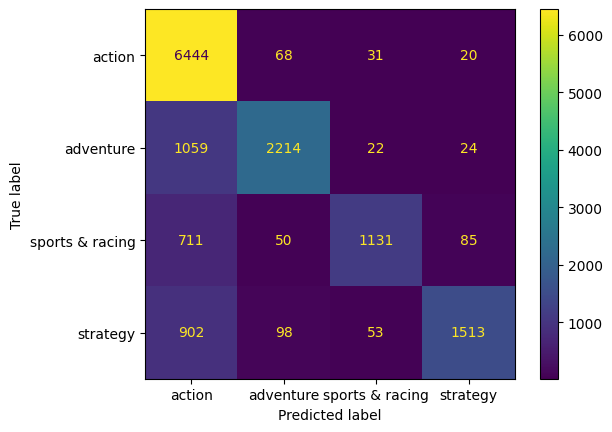

In [236]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

model = RandomForestClassifier(max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators= 100, random_state=42, )
model.fit(X_train, y_train)

# Predict the labels of the test set
y_pred_rf = model.predict(X_test)

print("Test Set")
# Print the accuracy score and classification report of the Logistic Regression model
print("Random Forest accuracy score:", accuracy_score(y_test, y_pred_rf))
print("Random Forest classification report:")
print(classification_report(y_test, y_pred_rf, target_names=mlb_y.classes_))
# #Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_rf.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()

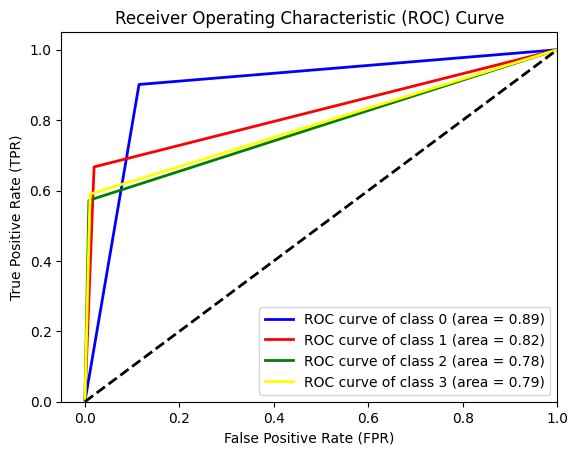

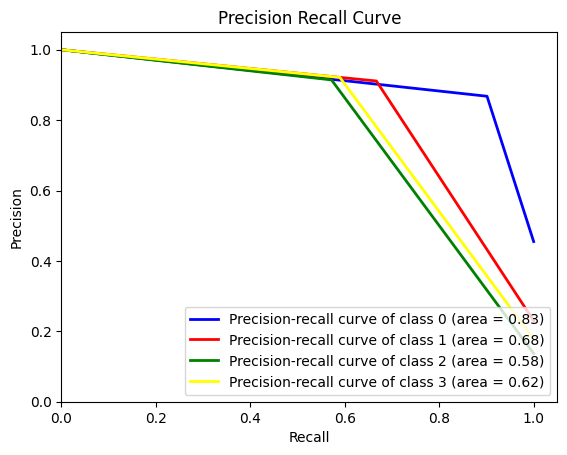

In [237]:
#Plot Roc Curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle

y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_rf = label_binarize(y_pred_rf, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred_rf[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
    label='ROC curve of class {0} (area = {1:0.2f})'
    ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# #Plot Precision Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_rf = label_binarize(y_pred_rf, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred_rf[:, i])
    average_precision[i] = average_precision_score(y_test[:, i], y_pred_rf[:, i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
    label='Precision-recall curve of class {0} (area = {1:0.2f})'
    ''.format(i, average_precision[i]))
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curve')
plt.legend(loc="lower right")
plt.show()

Test Set
KNN accuracy score: 0.5980589254766031
KNN classification report:
                 precision    recall  f1-score   support

         action       0.79      0.73      0.76      6563
      adventure       0.70      0.50      0.58      3319
sports & racing       0.61      0.49      0.54      1977
       strategy       0.68      0.47      0.55      2566

      micro avg       0.73      0.60      0.66     14425
      macro avg       0.69      0.55      0.61     14425
   weighted avg       0.72      0.60      0.65     14425
    samples avg       0.60      0.60      0.60     14425



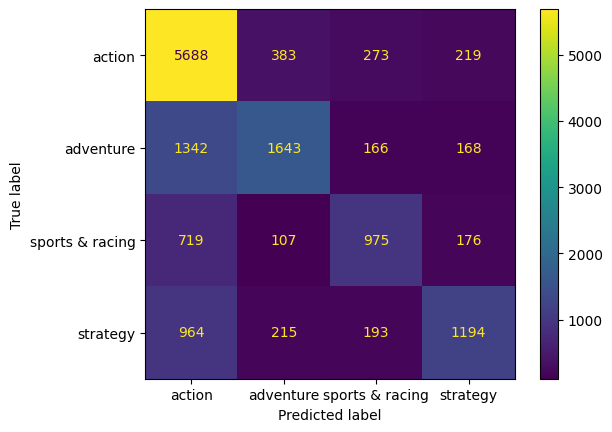

In [238]:
# Implement KNN for multi-label classification
from sklearn.neighbors import KNeighborsClassifier

knmodel = KNeighborsClassifier(n_neighbors=5)
knmodel.fit(X_train, y_train)

# Predict the labels of the test set
y_pred_kn = knmodel.predict(X_test)

print("Test Set")
# Print the accuracy score and classification report of the Logistic Regression model
print("KNN accuracy score:", accuracy_score(y_test, y_pred_kn))
print("KNN classification report:")
print(classification_report(y_test, y_pred_kn, target_names=mlb_y.classes_))

#Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_kn.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()

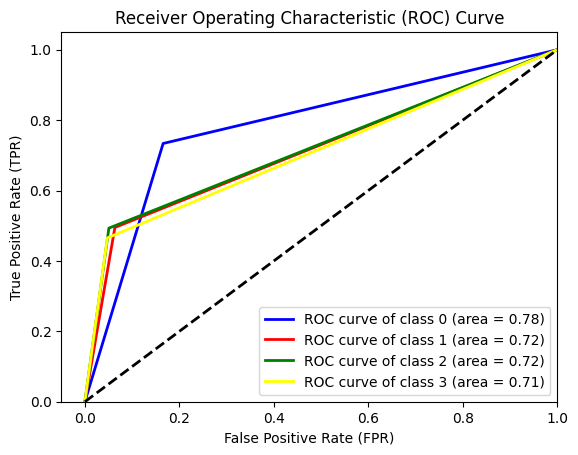

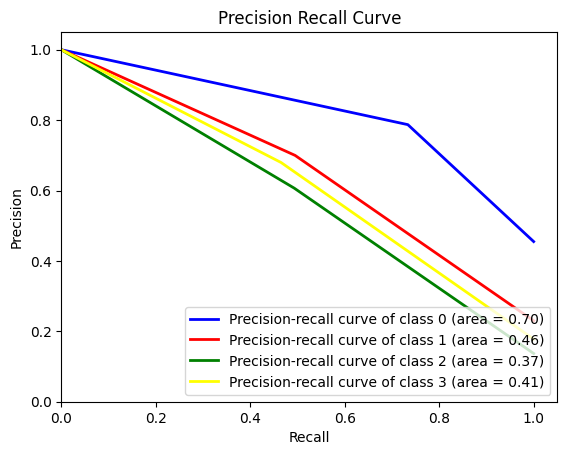

In [239]:
#Plot Roc Curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle

y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_kn = label_binarize(y_pred_kn, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred_kn[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
    label='ROC curve of class {0} (area = {1:0.2f})'
    ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# #Plot Precision Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_kn = label_binarize(y_pred_kn, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred_kn[:, i])
    average_precision[i] = average_precision_score(y_test[:, i], y_pred_kn[:, i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
    label='Precision-recall curve of class {0} (area = {1:0.2f})'
    ''.format(i, average_precision[i]))
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curve')
plt.legend(loc="lower right")
plt.show()

For deciding the hyperparameter, we used GridSearchCV using the below code

```python
## Implement Grid Search for Gradient Boosting
from sklearn.model_selection import GridSearchCV

param_grid = {
    'estimator__learning_rate': [0.1, 0.2, 0.3, 0.01, 0.5],
    'estimator__max_depth': [3, 5, 7, 9],
    'estimator__n_estimators': [100, 200, 300]

}

grid_search = GridSearchCV(gbmodel, param_grid, cv=3, n_jobs=10)
grid_search.fit(X_train, y_train)

print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

# Predict the labels of the test set
y_pred_gb_grid = grid_search.predict(X_test)

print("Test Set")
# Print the accuracy score and classification report of the Logistic Regression model
print("Gradient Boosting accuracy score:", accuracy_score(y_test, y_pred_gb_grid))
print("Gradient Boosting classification report:")
print(classification_report(y_test, y_pred_gb_grid, target_names=mlb_y.classes_))
```

Output
```bash
Best parameters: {'estimator__learning_rate': 0.1, 'estimator__max_depth': 9, 'estimator__n_estimators': 300}
Best cross-validation score: 0.79
Test Set
Gradient Boosting accuracy score: 0.7870363951473137
Gradient Boosting classification report:
                 precision    recall  f1-score   support

         action       0.87      0.91      0.89      6563
      adventure       0.86      0.76      0.81      3319
sports & racing       0.85      0.68      0.76      1977
       strategy       0.87      0.70      0.77      2566

      micro avg       0.87      0.80      0.83     14425
      macro avg       0.86      0.76      0.81     14425
   weighted avg       0.87      0.80      0.83     14425
    samples avg       0.80      0.80      0.80     14425

```

Test Set
Gradient Boosting accuracy score: 0.7870363951473137
Gradient Boosting classification report:
                 precision    recall  f1-score   support

         action       0.87      0.91      0.89      6563
      adventure       0.86      0.76      0.81      3319
sports & racing       0.85      0.68      0.76      1977
       strategy       0.87      0.70      0.77      2566

      micro avg       0.87      0.80      0.83     14425
      macro avg       0.86      0.76      0.81     14425
   weighted avg       0.87      0.80      0.83     14425
    samples avg       0.80      0.80      0.80     14425



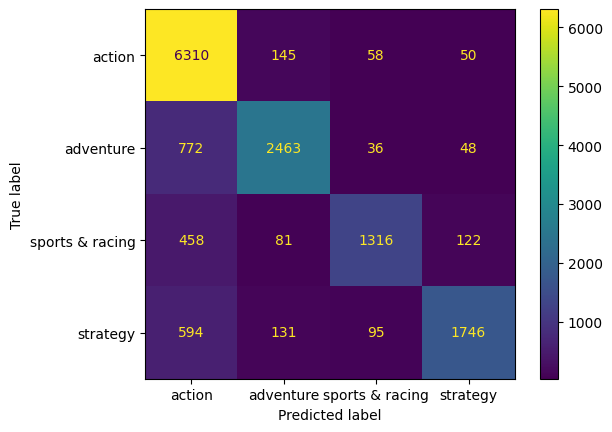

In [240]:
#Implement Gradient Boosting for multi-label classification
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import accuracy_score, classification_report


gbmodel = MultiOutputClassifier(GradientBoostingClassifier(n_estimators=300, learning_rate=0.1, max_depth=9, random_state=42), n_jobs=10)
gbmodel.fit(X_train, y_train)

# Predict the labels of the test set
y_pred_gb = gbmodel.predict(X_test)

print("Test Set")
# Print the accuracy score and classification report of the Logistic Regression model
print("Gradient Boosting accuracy score:", accuracy_score(y_test, y_pred_gb))
print("Gradient Boosting classification report:")
print(classification_report(y_test, y_pred_gb, target_names=mlb_y.classes_))

#Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_gb.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()

Score:  0.7870363951473137
Gradient Boosting classification report:
                 precision    recall  f1-score   support

         action       0.87      0.91      0.89      6563
      adventure       0.86      0.76      0.81      3319
sports & racing       0.85      0.68      0.76      1977
       strategy       0.87      0.70      0.77      2566

      micro avg       0.87      0.80      0.83     14425
      macro avg       0.86      0.76      0.81     14425
   weighted avg       0.87      0.80      0.83     14425
    samples avg       0.80      0.80      0.80     14425



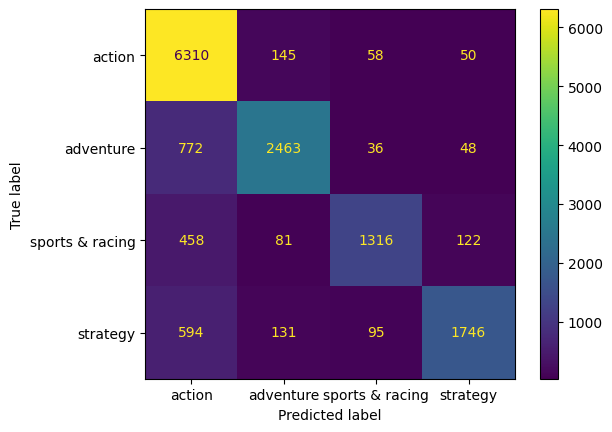

In [241]:
# load the model from disk
import pickle
filename = 'gradient_boosting_model.pk1'

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print("Score: ", result)
print("Gradient Boosting classification report:")
print(classification_report(y_test, y_pred_gb, target_names=mlb_y.classes_))

#Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_gb.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()

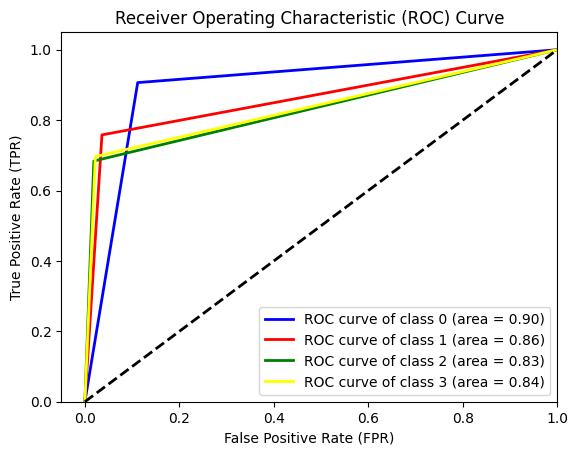

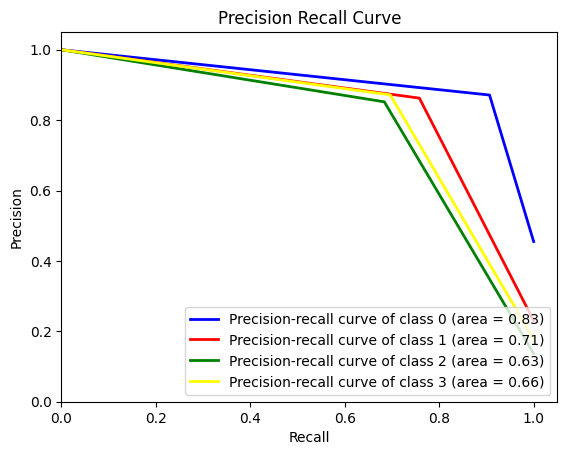

In [242]:
#Plot Roc Curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle

y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(y_pred_gb, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred_gb[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
    label='ROC curve of class {0} (area = {1:0.2f})'
    ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# #Plot Precision Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(y_pred_gb, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred_gb[:, i])
    average_precision[i] = average_precision_score(y_test[:, i], y_pred_gb[:, i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
    label='Precision-recall curve of class {0} (area = {1:0.2f})'
    ''.format(i, average_precision[i]))
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curve')
plt.legend(loc="lower right")
plt.show()


In [243]:
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier, LogisticRegression

NB_pipeline = Pipeline([
                ('clf', OneVsRestClassifier(LogisticRegression(C=10, penalty='l1', solver='liblinear'), n_jobs=10))
            ])
# NB_pipeline = Pipeline([
#                 ('clf', OneVsRestClassifier(LogisticRegression(), n_jobs=10))
#             ])
# NB_pipeline = Pipeline([
#                 ('clf', OneVsRestClassifier(MultinomialNB(
#                     fit_prior=True, class_prior=None), n_jobs=10))
#             ])

print('... Processing')
# train the model using X_dtm & y
NB_pipeline.fit(X_train, y_train)
# compute the testing accuracy
prediction = NB_pipeline.predict(X_test)
print('Test accuracy is {}'.format(accuracy_score(y_test, prediction)))
print('Classification report is {}'.format(classification_report(y_test, prediction)))


... Processing
Test accuracy is 0.7291507798960138
Classification report is               precision    recall  f1-score   support

           0       0.88      0.85      0.87      6563
           1       0.84      0.72      0.78      3319
           2       0.82      0.65      0.72      1977
           3       0.82      0.65      0.73      2566

   micro avg       0.86      0.76      0.80     14425
   macro avg       0.84      0.72      0.77     14425
weighted avg       0.85      0.76      0.80     14425
 samples avg       0.74      0.76      0.75     14425



Logistic Regression classification report:
                 precision    recall  f1-score   support

         action       0.88      0.85      0.87      6563
      adventure       0.84      0.72      0.78      3319
sports & racing       0.82      0.65      0.72      1977
       strategy       0.82      0.65      0.73      2566

      micro avg       0.86      0.76      0.80     14425
      macro avg       0.84      0.72      0.77     14425
   weighted avg       0.85      0.76      0.80     14425
    samples avg       0.74      0.76      0.75     14425



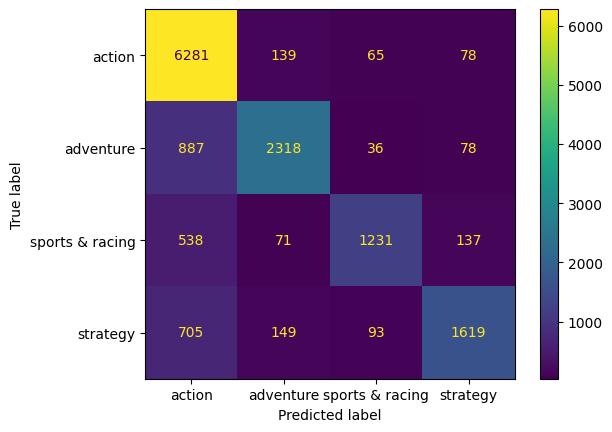

In [244]:
# Save the model as a pickle file
import pickle
filename = 'logistic_regression_model.pk1'
pickle.dump(NB_pipeline, open(filename, 'wb'))

# load the model from disk
import pickle
filename = 'logistic_regression_model.pk1'

loaded_model_NB = pickle.load(open(filename, 'rb'))
result = loaded_model_NB.predict(X_test)
# print("Score: ", result)
print("Logistic Regression classification report:")
print(classification_report(y_test, result, target_names=mlb_y.classes_))

#Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), result.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()

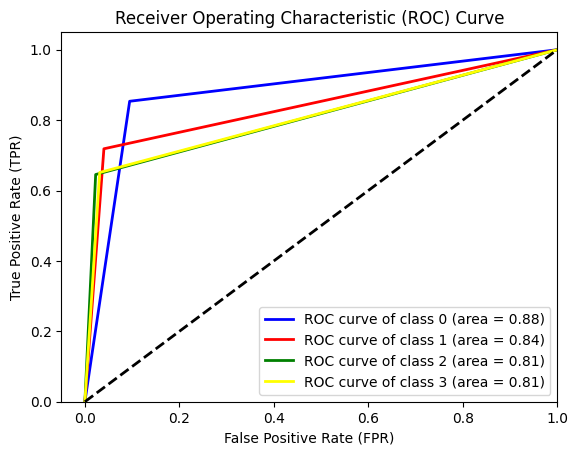

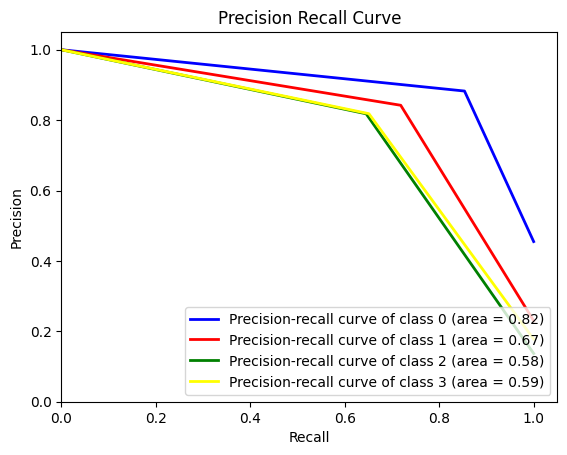

In [245]:
#Plot Roc Curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle

y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(result, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], result[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
    label='ROC curve of class {0} (area = {1:0.2f})'
    ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# #Plot Precision Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(result, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], result[:, i])
    average_precision[i] = average_precision_score(y_test[:, i], result[:, i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
    label='Precision-recall curve of class {0} (area = {1:0.2f})'
    ''.format(i, average_precision[i]))
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curve')
plt.legend(loc="lower right")
plt.show()

Type of y_train: <class 'numpy.ndarray'>
Shape of y_train: (57697, 4)
Test Set
CatBoost accuracy score: 0.7774003466204507
CatBoost classification report:
                 precision    recall  f1-score   support

         action       0.87      0.90      0.89      6563
      adventure       0.86      0.74      0.80      3319
sports & racing       0.84      0.68      0.75      1977
       strategy       0.87      0.69      0.77      2566

      micro avg       0.87      0.80      0.83     14425
      macro avg       0.86      0.75      0.80     14425
   weighted avg       0.87      0.80      0.83     14425
    samples avg       0.79      0.80      0.79     14425



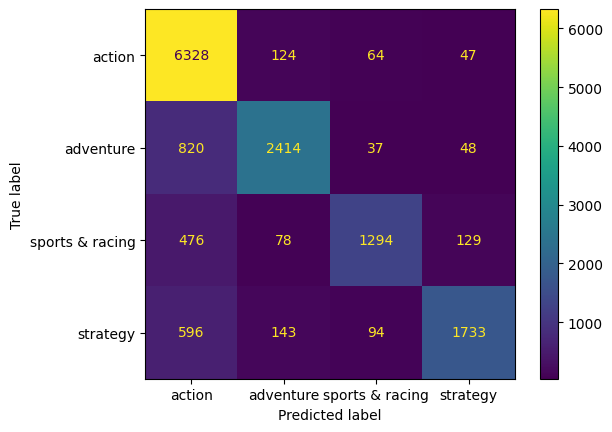

In [246]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.multioutput import MultiOutputClassifier

catmodel = MultiOutputClassifier(CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=3, random_state=42), n_jobs=10)
# catmodel.fit(X_train, y_train)
# Check the type and shape of y_train
print("Type of y_train:", type(y_train))
print("Shape of y_train:", y_train.shape)
 
# Convert to numpy array if it's not already
if not isinstance(y_train, np.ndarray):
    y_train_c = np.array(y_train)
 
# Check if y_train is a list of arrays and needs reshaping
if isinstance(y_train[0], np.ndarray):
    y_train_c = np.vstack(y_train)
 
# Ensure the labels are in the correct format for CatBoost
# For example, if it's a multiclass problem, y_train should be a 1D array
# If it's a multilabel problem, y_train should be a 2D binary array
 
# After adjusting y_train, try fitting the model again
catmodel.fit(X_train, y_train_c)

# Predict the labels of the test set
y_pred_cat = catmodel.predict(X_test)

print("Test Set")
# Print the accuracy score and classification report of the Logistic Regression model
print("CatBoost accuracy score:", accuracy_score(y_test, y_pred_cat))
print("CatBoost classification report:")
print(classification_report(y_test, y_pred_cat, target_names=mlb_y.classes_))

#Confusion Matrix and plot
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_cat.argmax(axis=1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlb_y.classes_)
disp.plot()
plt.show()
print()


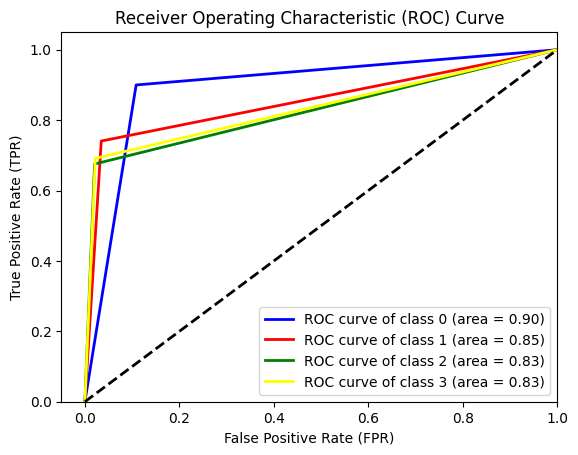

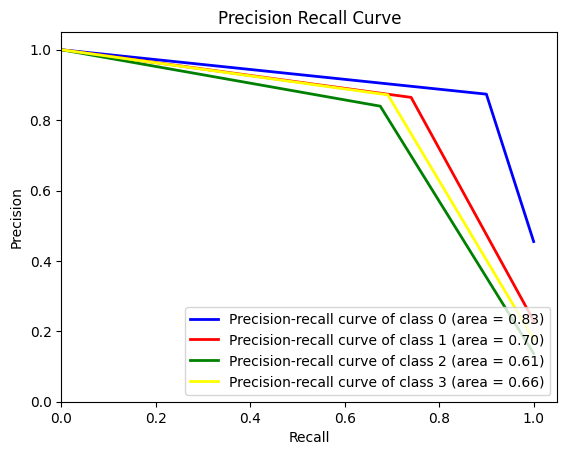

In [247]:
#Plot Roc Curve
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle

y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(y_pred_cat, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred_cat[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
    label='ROC curve of class {0} (area = {1:0.2f})'
    ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# #Plot Precision Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
from scipy import interp
from itertools import cycle
y_test = label_binarize(y_test, classes=mlb_y.classes_)
y_pred_gb = label_binarize(y_pred_cat, classes=mlb_y.classes_)
n_classes = y_test.shape[1]
precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_pred_cat[:, i])
    average_precision[i] = average_precision_score(y_test[:, i], y_pred_cat[:, i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
    label='Precision-recall curve of class {0} (area = {1:0.2f})'
    ''.format(i, average_precision[i]))
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curve')
plt.legend(loc="lower right")
plt.show()